# Warsztaty badawcze - modelowanie danych przemysłowych
#### Patrycja Żak, Mateusz Król, Mateusz Zacharecki

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import KNNImputer
from sklearn.preprocessing import QuantileTransformer
from skopt import BayesSearchCV
from catboost import CatBoostRegressor
import lightgbm as lgb
from xgboost import XGBRegressor
from sklearn.multioutput import MultiOutputRegressor
from scipy.stats import wilcoxon
import re
import unidecode

## Wczytanie danych

In [2]:
dir_path = os.getcwd()
os.chdir(dir_path)

In [3]:
file_path = 'danecsv.csv'

In [4]:
data = pd.read_csv(file_path, encoding='utf-8', sep=';', decimal='.')

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
data.head()

,Nr źródła,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Udział wydzieleń grafitu [%],Średnica sferoidów [μm],Wielkość sferoidów,Nodularity [%],Udział perlitu [%],Udział ferrytu [%],Rm [MPa] (as cast),A5 [%] (as cast),Minimalna grubość ścianki [mm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],"R0,2 [MPa]",A5 [%],Twardość Brinella [HB],Twardość Rockwella [HRC],Twardość Rockwella [HRA],Twardość Rockwella [HRB],Twardość Vickersa [HV],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %,Martensite volume fraction Xα',Retained austenite volume fraction XγR,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54
0,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,400.0,120.0,585.0,480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,385.0,120.0,701.0,636.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,371.0,120.0,1062.0,861.0,10.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,357.0,120.0,1105.0,946.0,9.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,343.0,120.0,1185.0,989.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
cols_to_drop = [*range(42,55,1)]
data.drop(data.columns[cols_to_drop], axis=1, inplace=True)

In [8]:
data.head()

,Nr źródła,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Udział wydzieleń grafitu [%],Średnica sferoidów [μm],Wielkość sferoidów,Nodularity [%],Udział perlitu [%],Udział ferrytu [%],Rm [MPa] (as cast),A5 [%] (as cast),Minimalna grubość ścianki [mm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],"R0,2 [MPa]",A5 [%],Twardość Brinella [HB],Twardość Rockwella [HRC],Twardość Rockwella [HRA],Twardość Rockwella [HRB],Twardość Vickersa [HV],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %,Martensite volume fraction Xα',Retained austenite volume fraction XγR
0,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,400.0,120.0,585.0,480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.7,NaN,NaN
1,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,385.0,120.0,701.0,636.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.5,NaN,NaN
2,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,371.0,120.0,1062.0,861.0,10.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN
3,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,357.0,120.0,1105.0,946.0,9.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.5,NaN,NaN
4,1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,NaN,25.4,927.0,120.0,343.0,120.0,1185.0,989.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.2,NaN,NaN


In [9]:
print("Podstawowe informacje:")
data.info()

Podstawowe informacje:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1560 entries, 0 to 1559
Data columns (total 42 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Nr źródła                                 1505 non-null   object 
 1   C [%]                                     1441 non-null   float64
 2   Si [%]                                    1441 non-null   float64
 3   S [%]                                     1377 non-null   float64
 4   P [%]                                     1362 non-null   float64
 5   Mg [%]                                    1278 non-null   float64
 6   Mn [%]                                    1402 non-null   float64
 7   Ni [%]                                    1261 non-null   float64
 8   Cu [%]                                    1225 non-null   float64
 9   Mo [%]                                    1062 non-null   float64
 10  Cr [%]       

## Kolumny zmiennych niezależnych

| **Typ danych**           | **Opis**                                                                                                                                                            |
|---------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Nr źródła**            | Identyfikator danych, nie jest zmienną do analizy.                                                                                                                  |
| **Węgiel, Krzem**         | Kluczowe składniki w wytopie. Wartości graniczne: **Węgiel: 3-4%, Krzem: 2-3%.**                                                                                     |
| **Zanieczyszczenia**      | **Fosfor, Siarka** - niepożądane, powinny wynosić **≤0.02%** (przekroczenie wymaga dodania magnezu). Brak danych nie oznacza 0 - do imputacji.                        |
| **Magnez, Siarka**        | **Magnez: 0.025–0.075%**, z zaleceniem **0.035–0.065%**. Siarka wiąże magnez, co wpływa na proces sferoidyzacji. Brak wartości magnezu oznacza brak danych.           |
| **Miedź, Nikiel**         | Dodawane specjalnie (domyślnie brak). **Jeśli >0.3–0.5%,** zwiększa wytrzymałość na rozciąganie. Wartości śladowe: 0.01–0.05%.                                       |
| **Chrom, Aluminium, Cyna** | Domyślna wartość **0 (lub 10^-4 dla śladowych ilości).** Brak w danych oznacza 0.                                                                                    |
| **Materiały w stanie lanym** | Analizowane w dwóch etapach: **sferoidyzacja i obróbka cieplna**.                                                                                                   |
| **Liczba wydzieleń, udział wydzieleń** | Liczba i procent powierzchni kulek sferoidu. Zależne od zawartości krzemu i innych pierwiastków.                                                         |
| **Wielkość sferoidów**    | Mierzona na podstawie wzorca (% spełniających normy). Dane z mikrofotografii można złączyć i uzyskać jedną kolumnę.                                                 |
| **Modularność**           | Procent zgodności kształtu z idealną kulką. Wartość zależna od poziomów magnezu i siarki.                                                                           |
| **Skład osnowy**          | **Ferryty+Perlity=100%**. Brakujące dane uzupełnić: np. **Perlit=100-Ferryt.** Zawartość węgla nie może sumować się z osnową.                                        |
| **Minimalna grubość ścianki** | Nieistotne dla analizy, można usunąć.                                                                                                                           |
| **Obróbka cieplna**       | **4 kolumny (AJ-AN):** temperatury i czasy. Typowe zakresy: 900–1050°C (austenityzacja), 250–400°C (izotermiczna). Brak danych oznacza brak procesu.                 |
| **Temperatura pomiaru udarności** | Zmienna niezależna. Słabo wypełniona, domyślnie zakładana pokojowa (21–23°C).                                                                                |
| **Austenit, martenzyt**   | Procentowy udział w strukturze. Obserwacje z niskimi wartościami martenzytu można usunąć, bo wskazują błędny proces.                                                |

## Kolumny zmiennych zależnych

| **Zmienne zależne**      | **Opis**                                                                                                                                                         |
|---------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Rm**                   | Wytrzymałość na rozciąganie maksymalna.                                                                                                                         |
| **R02**                  | Umowna granica plastyczności. Silna korelacja z Rm (**r ≈ 0.8**).                                                                                                |
| **A5**                   | Wydłużenie, silnie powiązane z Rm (można uzupełniać na podstawie krzywych regresji).                                                                              |
| **Twardości**            | **Brinella, Rockwella, Vickersa** - można przeliczać między sobą. Końcowo interesuje twardość Brinella.                                                          |
| **Udarność**             | Ilość energii pochłoniętej przy złamaniu próbki.                                                                                                                 |
| **Udział austenitu**     | Procentowa ilość austenitu po obróbce cieplnej.                                                                                                                  |

### Przykłady uzupełniania danych
- **Magnez i Siarka:** Braki magnezu imputować w oparciu o standardowy przedział (0.035–0.065%).
- **Skład osnowy:** Jeśli znany jest jeden składnik (ferryt/perlit), wyliczyć drugi: **Perlit = 100 - Ferryt.**
- **Twardości:** Uzupełniać przez przeliczanie między metodami na podstawie wzorów konwersji.
- **Wielkość sferoidów:** Łączyć kolumny danych z mikrofotografii (średnia wielkość i norma sferoidów).
- **Temperatura obróbki cieplnej:** Domyślnie przypisać brak procesów w przypadku pustych wartości w kolumnach AJ-AN.

### Graniczne wartości dla weryfikacji i imputacji
| **Pierwiastek**   | **Zakres**              |
|--------------------|-------------------------|
| Węgiel            | 3-4%                   |
| Krzem             | 2-3%                   |
| Magnez            | 0.025-0.075%           |
| Fosfor, Siarka    | ≤0.02%                 |
| Miedź, Nikiel     | Śladowo: 0.01-0.05%    |
| Miedź, Nikiel     | Wpływ: 0.3-0.5%        |

## Algorytmy uzupełniania

1. **Sieci neuronowe:**
   - Aktywacja: sigmoid, tanh lub ReLU.
   - Struktura: jedna warstwa ukryta, liczba neuronów: \( \sqrt{\text{wejście}} \).
2. **Regresje:**
   - Regresja liniowa lub nieliniowa (np. PPR, Friedmana).
   - Odrzucić regresję trzeciego stopnia.
3. **Normalizacja danych:**
   - Softmin-max dla wartości liczbowych.
   - Nieliniowa dla danych kategorycznych.

#### Niepotrzebne kolumny

In [10]:
print(data.columns)

Index(['Nr źródła', 'C [%]', 'Si [%]', 'S [%]', 'P [%]', 'Mg [%]', 'Mn [%]',
       'Ni [%]', 'Cu [%]', 'Mo [%]', 'Cr [%]', 'Al [%]', 'Sn [%]', 'B [%]',
       'V [%]', 'Wydzielenia grafitu [mm-2]', 'Udział wydzieleń grafitu [%]',
       'Średnica sferoidów [μm]', 'Wielkość sferoidów', 'Nodularity [%]',
       'Udział perlitu [%]', 'Udział ferrytu [%]', 'Rm [MPa] (as cast)',
       'A5 [%]     (as cast)', 'Minimalna grubość ścianki [mm]',
       'Temperatura austenityzacji [˚C]', 'Czas austenityzacji [min.]',
       'Temperatura przemiany izotermicznej [˚C]',
       'Czas przemiany izotermicznej [min.]', 'Rm [MPa]', 'R0,2 [MPa]',
       'A5 [%]', 'Twardość Brinella [HB]', 'Twardość Rockwella [HRC]',
       'Twardość Rockwella [HRA]', 'Twardość Rockwella [HRB]',
       'Twardość Vickersa [HV]', 'Udarność Charpy [J]',
       'Temperatura pomiaru udarności [˚C]', 'Udział austenitu %',
       'Martensite volume fraction Xα'',
       'Retained austenite volume fraction XγR '],
      dtype='

In [11]:
# Usuwanie białych znaków i apostrofów
data.columns = data.columns.str.strip().str.replace("'", "")

In [12]:
data.drop(['Nr źródła',
           'Minimalna grubość ścianki [mm]',
           'Martensite volume fraction Xα',
           'Retained austenite volume fraction XγR'],
           axis=1, inplace=True)

#### Usuwanie pustych wierszy

In [13]:
len(data)

1560

In [14]:
data.dropna(how='all', inplace=True)

In [15]:
len(data)

1446

#### Braki danych

Procent brakujących danych:
 C [%]                                         0.345781
Si [%]                                        0.345781
S [%]                                         4.771784
P [%]                                         5.809129
Mg [%]                                       11.618257
Mn [%]                                        3.042877
Ni [%]                                       12.793914
Cu [%]                                       15.283541
Mo [%]                                       26.556017
Cr [%]                                       67.150761
Al [%]                                       71.438451
Sn [%]                                       71.645920
B [%]                                        72.268326
V [%]                                        71.991701
Wydzielenia grafitu [mm-2]                   63.208852
Udział wydzieleń grafitu [%]                 90.525588
Średnica sferoidów [μm]                      87.551867
Wielkość sferoidów                  

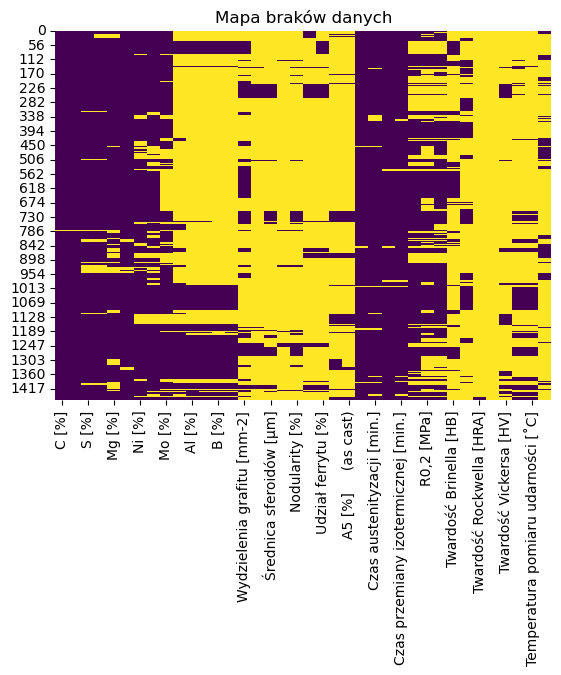

In [16]:
# Procent braków w każdej kolumnie
missing_summary = data.isnull().mean() * 100
print("Procent brakujących danych:\n", missing_summary)

# Wizualizacja braków danych
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Mapa braków danych")
plt.show()

#### Outliers

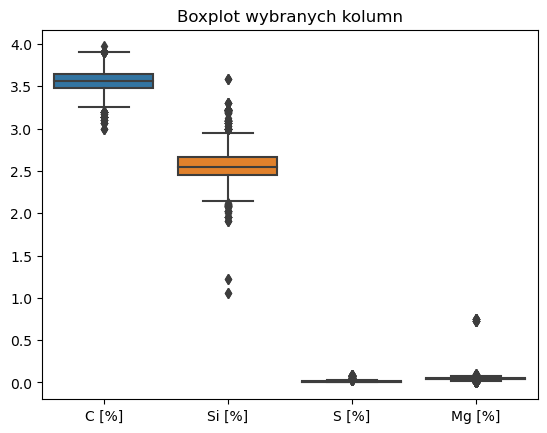

Wartości odstające w C [%] (z-score):
347     3.00
504     3.00
522     3.10
530     3.10
814     3.14
815     3.14
816     3.14
851     3.14
852     3.14
853     3.14
854     3.14
855     3.14
856     3.14
857     3.14
858     3.14
859     3.14
860     3.14
861     3.14
862     3.14
863     3.14
864     3.14
865     3.14
866     3.14
867     3.14
868     3.14
925     3.10
926     3.10
927     3.10
1000    3.97
1002    3.00
1374    3.07
1375    3.07
1376    3.07
1377    3.07
1378    3.07
Name: C [%], dtype: float64
Wartości odstające w Si [%] (z-score):
116     1.95
117     1.95
432     3.30
433     3.30
434     3.30
        ... 
1454    3.06
1455    3.06
1456    3.06
1457    3.06
1458    3.06
Name: Si [%], Length: 151, dtype: float64
Wartości odstające w S [%] (z-score):
667     0.029
668     0.029
669     0.029
678     0.031
679     0.031
        ...  
1466    0.042
1467    0.042
1468    0.042
1469    0.042
1470    0.042
Name: S [%], Length: 70, dtype: float64
Wartości odstające w Mg

In [17]:
# Boxploty dla wybranych kolumn
selected_columns = ['C [%]', 'Si [%]', 'S [%]', 'Mg [%]']  # Zmień na odpowiednie nazwy kolumn
sns.boxplot(data=data[selected_columns])
plt.title("Boxplot wybranych kolumn")
plt.show()

# Statystyka odchylenia od mediany (robust z-score)
from scipy.stats import median_abs_deviation

for col in selected_columns:
    if data[col].dtype in ['float64', 'int64']:
        median = data[col].median()
        mad = median_abs_deviation(data[col].dropna())
        z_score = (data[col] - median) / (1.4826 * mad)
        print(f"Wartości odstające w {col} (z-score):")
        print(data.loc[np.abs(z_score) > 3, col])

#### Korelacje

In [18]:
float_data = data.select_dtypes(include=['float'])

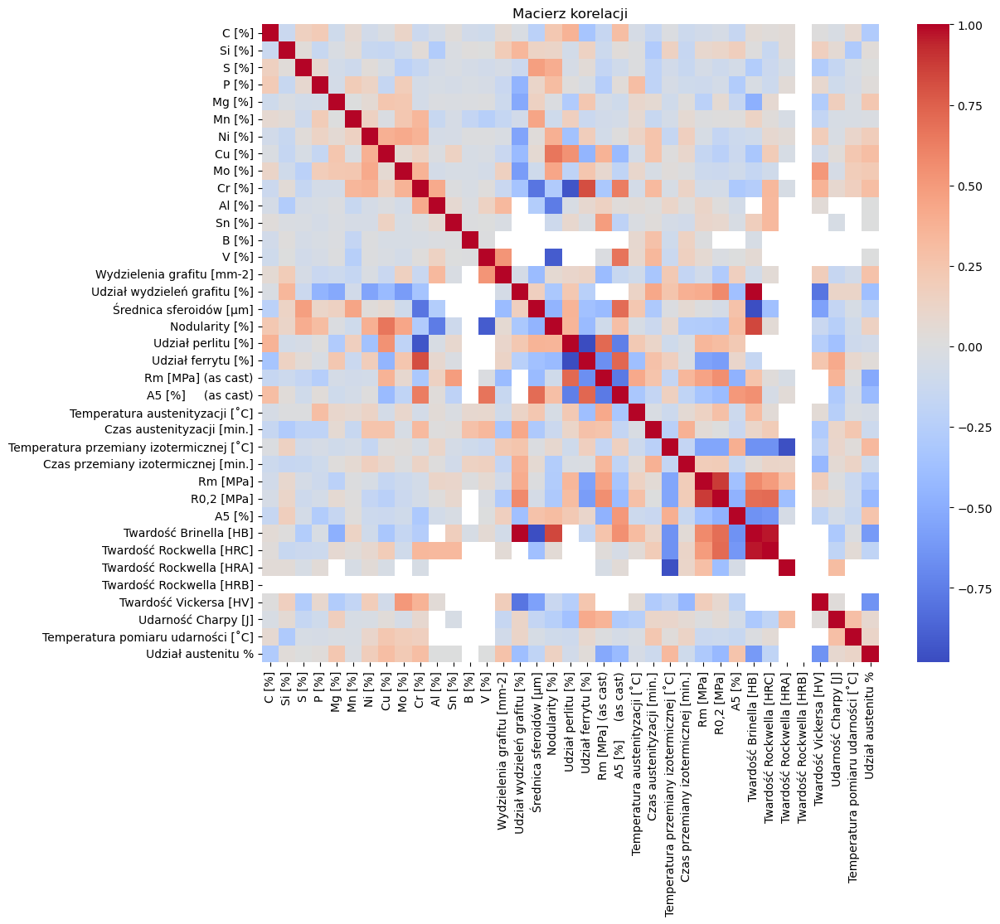

In [19]:
# Korelacja między zmiennymi liczbowymi
correlation_matrix = float_data.corr()

# Wizualizacja macierzy korelacji
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap="coolwarm")
plt.title("Macierz korelacji")
plt.show()

## Praca na kopii danych

In [20]:
data_copy = data.copy()

#### Uzupełnienie kolumn, które zawierają informacje uzupełniające

1. Udział perlitu + udział ferrytu = 100% (węgiel nie może być tam uwzględniony)

In [21]:
data_copy[['Udział perlitu [%]', 'Udział ferrytu [%]', 'C [%]']]

,Udział perlitu [%],Udział ferrytu [%],C [%]
0,80.0,NaN,3.40
1,80.0,NaN,3.40
2,80.0,NaN,3.40
3,80.0,NaN,3.40
4,80.0,NaN,3.40
...,...,...,...
1466,NaN,NaN,3.58
1467,NaN,NaN,3.58
1468,NaN,NaN,3.58
1469,NaN,NaN,3.58


In [22]:
# Zliczanie brakujących danych
missing_ferrite = data_copy["Udział ferrytu [%]"].isna().sum()
missing_pearlite = data_copy["Udział perlitu [%]"].isna().sum()
missing_both = data_copy[data_copy["Udział ferrytu [%]"].isna() & data_copy["Udział perlitu [%]"].isna()].shape[0]
requires_scaling = ((data_copy["Udział ferrytu [%]"] + data_copy["Udział perlitu [%]"] + data_copy["C [%]"] == 100) &
                    (data_copy["Udział ferrytu [%]"] + data_copy["Udział perlitu [%]"] != 100)).sum()

print(f"Liczba brakujących wartości w ferrycie: {missing_ferrite}")
print(f"Liczba brakujących wartości w perlicie: {missing_pearlite}")
print(f"Liczba przypadków, gdzie brak obu wartości (ferryt i perlit): {missing_both}")
print(f"Liczba przypadków wymagających przeskalowania: {requires_scaling}")

Liczba brakujących wartości w ferrycie: 1250
Liczba brakujących wartości w perlicie: 1271
Liczba przypadków, gdzie brak obu wartości (ferryt i perlit): 1223
Liczba przypadków wymagających przeskalowania: 0


In [23]:
# Korekcja danych w kopii
for idx, row in data_copy.iterrows():
    ferrite = row["Udział ferrytu [%]"]
    pearlite = row["Udział perlitu [%]"]
    carbon = row["C [%]"]

    # Jeśli oba NaN, pomijamy, bo brak danych do uzupełnienia
    if pd.isna(ferrite) and pd.isna(pearlite):
        continue

    # Uzupełnianie brakujących wartości
    if pd.isna(ferrite):
        data_copy.at[idx, "Udział ferrytu [%]"] = 100 - pearlite
    elif pd.isna(pearlite):
        data_copy.at[idx, "Udział perlitu [%]"] = 100 - ferrite

In [24]:
# Zliczanie brakujących danych
missing_ferrite_after = data_copy["Udział ferrytu [%]"].isna().sum()
missing_pearlite_after = data_copy["Udział perlitu [%]"].isna().sum()
missing_both_after = data_copy[data_copy["Udział ferrytu [%]"].isna() & data_copy["Udział perlitu [%]"].isna()].shape[0]

print(f"Liczba brakujących wartości w ferrycie: {missing_ferrite_after}")
print(f"Liczba brakujących wartości w perlicie: {missing_pearlite_after}")
print(f"Liczba przypadków, gdzie brak obu wartości (ferryt i perlit): {missing_both_after}")

Liczba brakujących wartości w ferrycie: 1223
Liczba brakujących wartości w perlicie: 1223
Liczba przypadków, gdzie brak obu wartości (ferryt i perlit): 1223


#### Usuwamy jedną z kolumn, bo informacje się uzupełniają: usuwamy ferryt

In [25]:
data_copy.drop('Udział ferrytu [%]', axis=1, inplace=True)

In [26]:
data_copy.head()

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Udział wydzieleń grafitu [%],Średnica sferoidów [μm],Wielkość sferoidów,Nodularity [%],Udział perlitu [%],Rm [MPa] (as cast),A5 [%] (as cast),Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],"R0,2 [MPa]",A5 [%],Twardość Brinella [HB],Twardość Rockwella [HRC],Twardość Rockwella [HRA],Twardość Rockwella [HRB],Twardość Vickersa [HV],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,400.0,120.0,585.0,480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.7
1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,385.0,120.0,701.0,636.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.5
2,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,371.0,120.0,1062.0,861.0,10.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0
3,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,357.0,120.0,1105.0,946.0,9.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.5
4,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,343.0,120.0,1185.0,989.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.2


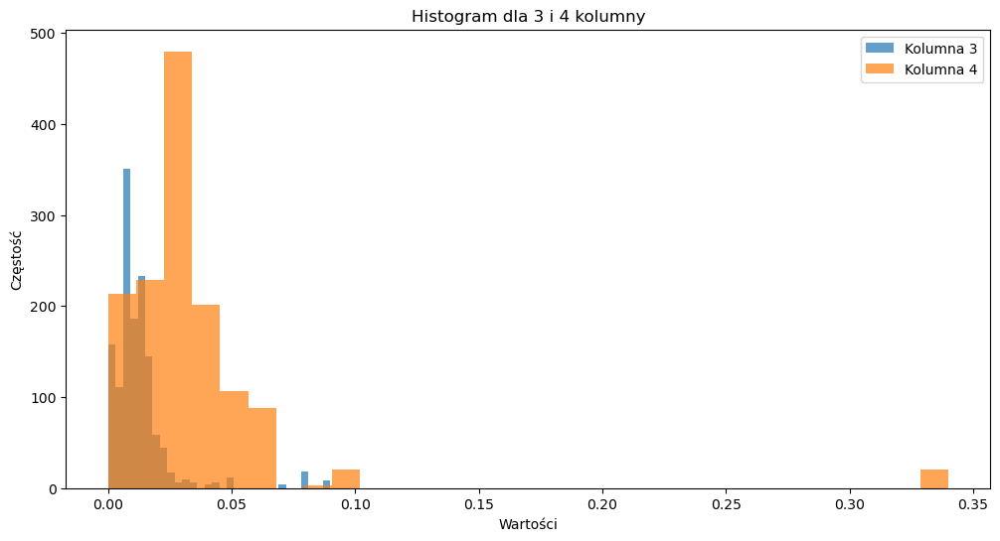

In [27]:
# Histogram dla 3 i 4 kolumny
plt.figure(figsize=(12, 6))
plt.hist(data_copy.iloc[:, 2], bins=30, alpha=0.7, label='Kolumna 3')
plt.hist(data_copy.iloc[:, 3], bins=30, alpha=0.7, label='Kolumna 4')
plt.title('Histogram dla 3 i 4 kolumny')
plt.xlabel('Wartości')
plt.ylabel('Częstość')
plt.legend()
plt.show()

In [28]:
data_copy.iloc[:, 3].nlargest(25)

1348    0.34
1349    0.34
1350    0.34
1351    0.34
1352    0.34
1353    0.34
1354    0.34
1355    0.34
1356    0.34
1357    0.34
1358    0.34
1359    0.34
1360    0.34
1361    0.34
1362    0.34
1363    0.34
1364    0.34
1365    0.34
1366    0.34
1367    0.34
872     0.10
873     0.10
874     0.10
875     0.10
876     0.10
Name: P [%], dtype: float64

Na podstawie powyższego histogramu widać, że są przypadki, gdzie te zanieczyszczenia nie są znikome (kolumna 4 - fosfor dla jakiegoś przypadku znacznie odstaje od reszty). Jest jednak takich przypadków 20. Mimo to oznacza, że proces był źle przeprowadzony i wiersze trzeba usunąć.

In [29]:
data_copy = data_copy[data_copy.iloc[:, 3] != 0.34]

#### Wartości graniczne

In [30]:
data_copy.head()

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Udział wydzieleń grafitu [%],Średnica sferoidów [μm],Wielkość sferoidów,Nodularity [%],Udział perlitu [%],Rm [MPa] (as cast),A5 [%] (as cast),Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],"R0,2 [MPa]",A5 [%],Twardość Brinella [HB],Twardość Rockwella [HRC],Twardość Rockwella [HRA],Twardość Rockwella [HRB],Twardość Vickersa [HV],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,400.0,120.0,585.0,480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.7
1,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,385.0,120.0,701.0,636.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.5
2,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,371.0,120.0,1062.0,861.0,10.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0
3,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,357.0,120.0,1105.0,946.0,9.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.5
4,3.4,2.41,0.017,0.015,0.064,0.15,0.001,0.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,NaN,NaN,927.0,120.0,343.0,120.0,1185.0,989.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.2


In [31]:
# Weryfikacja poziomów węgla i krzemu
carbon_limit = (3.0, 4.0)
silicon_limit = (2.0, 3.0)

out_of_range = data_copy[(data_copy['C [%]'] < carbon_limit[0]) | (data_copy['C [%]'] > carbon_limit[1]) |
                    (data_copy['Si [%]'] < silicon_limit[0]) | (data_copy['Si [%]'] > silicon_limit[1])]

print("Liczba wierszy poza zakresem dla węgla i krzemu:")
print(len(out_of_range))


Liczba wierszy poza zakresem dla węgla i krzemu:
146


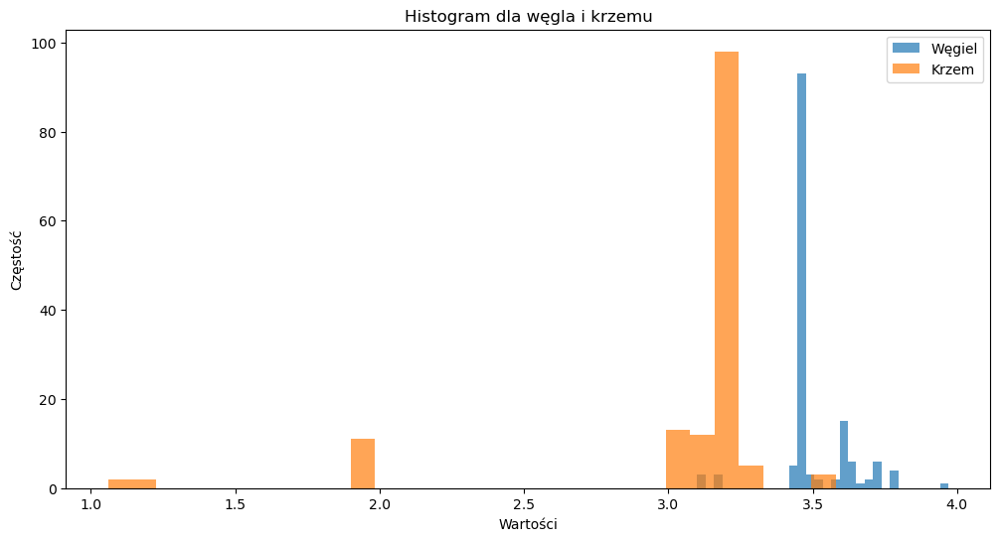

In [32]:
# Histogram dla 1 i 2 kolumny
plt.figure(figsize=(12, 6))
plt.hist(out_of_range.iloc[:, 0], bins=30, alpha=0.7, label='Węgiel')
plt.hist(out_of_range.iloc[:, 1], bins=30, alpha=0.7, label='Krzem')
plt.title('Histogram dla węgla i krzemu')
plt.xlabel('Wartości')
plt.ylabel('Częstość')
plt.legend()
plt.show()

#### Uzupełniamy brakujące wartości kolumn nikiel, miedz, chrom, aluminium, cyna wartością $10^{-4}$

In [33]:
data_copy[['Ni [%]', 'Cu [%]', 'Cr [%]', 'Al [%]', 'Sn [%]']] = data_copy[['Ni [%]', 'Cu [%]', 'Cr [%]', 'Al [%]', 'Sn [%]']].fillna(0.0001)

#### Uzupełniamy wartości kolumny 'Średnica sferoidów [μm]' na bazie wartości z kolumny 'Wielkość sferoidów'

In [34]:
data_copy['Wielkość sferoidów'].value_counts()

6 i 7    18
5        11
6         5
4         5
Name: Wielkość sferoidów, dtype: int64

In [35]:
replacement_dict = {'4': '18', '5': '9', '6': '4.5', '6 i 7': '3'}
data_copy['Wielkość sferoidów'] = data_copy['Wielkość sferoidów'].replace(replacement_dict)

In [36]:
data_copy['Wielkość sferoidów'] = data_copy['Wielkość sferoidów'].astype(float)

In [37]:
data_copy['Średnica sferoidów [μm]'] = data_copy['Średnica sferoidów [μm]'].fillna(data_copy['Wielkość sferoidów'])
data_copy = data_copy.drop('Wielkość sferoidów', axis = 1)

#### Uzupełniamy brakujące wartości kolumny 'Temperatura pomiaru udarności [˚C]' wartością 22

In [38]:
data_copy['Temperatura pomiaru udarności [˚C]'] = data_copy['Temperatura pomiaru udarności [˚C]'].fillna(22)

#### Usuwanie niepoprawnych procesów

In [39]:
# robione już teraz, z uwagi na niewielką liczbę braków danych w tych kolumnach

data_copy = data_copy[data_copy['Mg [%]'] >= 0.025]
data_copy = data_copy[data_copy['Temperatura austenityzacji [˚C]'] >= 900]
data_copy = data_copy[data_copy['Czas austenityzacji [min.]'] > 1]

#### Uzupełniamy brakujące wartości kolumn Siarka, Fosfor i Mangan medianą obs. nieodstających, ponieważ w tych kolumnych jest mało braków i nie ma wyraźnej korelacji z niczym

In [40]:
data_copy['S [%]'] =  data_copy['S [%]'].fillna(data_copy['S [%]'].median())
data_copy['P [%]'] =  data_copy['P [%]'].fillna(data_copy['P [%]'].median())
data_copy['Mn [%]'] =  data_copy['Mn [%]'].fillna(data_copy['Mn [%]'].median())

#### To samo z czasem przemiany izotermicznej, a z temperaturą wykorzystamy zależność z twardością

In [41]:
print(data_copy['Temperatura przemiany izotermicznej [˚C]'].corr(data_copy['Twardość Rockwella [HRC]']))
print(data_copy['Czas przemiany izotermicznej [min.]'].corr(data_copy['Twardość Rockwella [HRC]']))

-0.7075717958428663
0.15063313554984298


In [42]:
data_copy['Czas przemiany izotermicznej [min.]'] =  data_copy['Czas przemiany izotermicznej [min.]'].fillna(data_copy['Czas przemiany izotermicznej [min.]'].median())

#### Imputacje danych przy użyciu zmiennych zależnych i usuwanie zmiennych zależnych

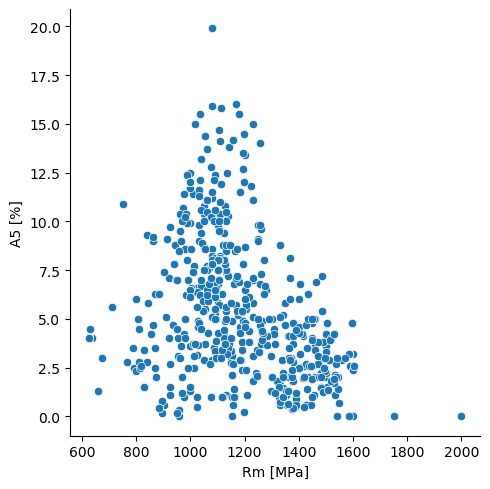

In [43]:
sns.relplot(x = "Rm [MPa]", y = "A5 [%]", data = data_copy)

In [44]:
c = data_copy.iloc[:,:-1].corr()

#tylko dolna część macierzy
mask = np.triu(np.ones(c.shape), k=1).astype(bool)
s = c.where(mask).unstack()

result = s[(s >= 0.7) | (s <= -0.7)].sort_values(ascending=False)
print(result.to_string())

Twardość Brinella [HB]               Udział wydzieleń grafitu [%]                1.000000
A5 [%]     (as cast)                 V [%]                                       0.999749
Udział wydzieleń grafitu [%]         Wydzielenia grafitu [mm-2]                  0.980894
Twardość Rockwella [HRC]             Twardość Brinella [HB]                      0.965808
Twardość Vickersa [HV]               R0,2 [MPa]                                  0.945382
                                     Rm [MPa]                                    0.891870
R0,2 [MPa]                           Rm [MPa]                                    0.881776
Udział wydzieleń grafitu [%]         S [%]                                       0.865845
Czas austenityzacji [min.]           Udział wydzieleń grafitu [%]                0.847538
Twardość Brinella [HB]               Nodularity [%]                              0.841889
Udział wydzieleń grafitu [%]         Mg [%]                                      0.771428
Twardość R

(array([  4.,  23.,  56., 129.,  61.,  60.,  79.,  15.,   6.,   2.]),
 array([22.8 , 26.32, 29.84, 33.36, 36.88, 40.4 , 43.92, 47.44, 50.96,
        54.48, 58.  ]),
 <BarContainer object of 10 artists>)

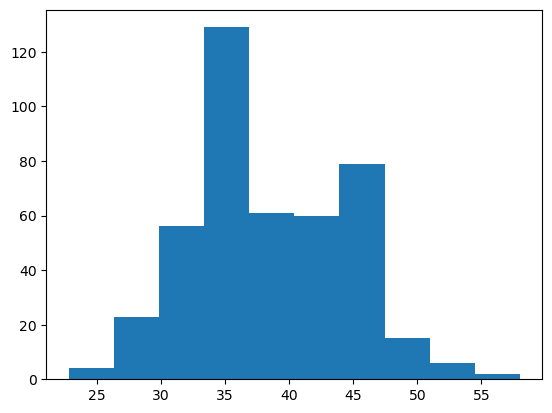

In [45]:
plt.hist(data['Twardość Rockwella [HRC]'])

In [46]:
print("max HRC w danych: ", max(data['Twardość Rockwella [HRC]'].dropna()))
print("min HRC w danych: ",min(data['Twardość Rockwella [HRC]'].dropna()))

max HRC w danych:  58.0
min HRC w danych:  22.8


In [47]:
# Imputacja HB z przybliżonych wzorów
data_copy['Twardość Brinella [HB]'] = data_copy['Twardość Brinella [HB]'].fillna(0.92 * data_copy['Twardość Vickersa [HV]'] + 10)
data_copy['Twardość Brinella [HB]'] = data_copy['Twardość Brinella [HB]'].fillna(((-3.8) * data_copy['Twardość Rockwella [HRC]']) + (0.18 * ((data_copy['Twardość Rockwella [HRC]'])**2)) + 240)
data_copy['Twardość Brinella [HB]'] = data_copy['Twardość Brinella [HB]'].fillna(((-64) * data_copy['Twardość Rockwella [HRA]']) + (0.6 * ((data_copy['Twardość Rockwella [HRA]'])**2)) + 1959)

# Korelacja dodatnia
data_copy['A5 [%]     (as cast)'] = data_copy['A5 [%]     (as cast)'].fillna((data_copy['V [%]'] - np.mean(data_copy['V [%]'])) * np.std(data_copy['A5 [%]     (as cast)']) / np.std(data_copy['V [%]']) + np.mean(data_copy['A5 [%]     (as cast)']))
data_copy['Wydzielenia grafitu [mm-2]'] = data_copy['Wydzielenia grafitu [mm-2]'].fillna((data_copy['Udział wydzieleń grafitu [%]'] - np.mean(data_copy['Udział wydzieleń grafitu [%]'])) * np.std(data_copy['Wydzielenia grafitu [mm-2]']) / np.std(data_copy['Udział wydzieleń grafitu [%]']) + np.mean(data_copy['Wydzielenia grafitu [mm-2]']))
data_copy['S [%]'] = data_copy['S [%]'].fillna((data_copy['Udział wydzieleń grafitu [%]'] - np.mean(data_copy['Udział wydzieleń grafitu [%]'])) * np.std(data_copy['S [%]']) / np.std(data_copy['Udział wydzieleń grafitu [%]']) + np.mean(data_copy['S [%]']))
data_copy['Czas austenityzacji [min.]'] = data_copy['Czas austenityzacji [min.]'].fillna((data_copy['Udział wydzieleń grafitu [%]'] - np.mean(data_copy['Udział wydzieleń grafitu [%]'])) * np.std(data_copy['Czas austenityzacji [min.]']) / np.std(data_copy['Udział wydzieleń grafitu [%]']) + np.mean(data_copy['Czas austenityzacji [min.]']))
data_copy['Twardość Brinella [HB]'] = data_copy['Twardość Brinella [HB]'].fillna((data_copy['Nodularity [%]'] - np.mean(data_copy['Nodularity [%]'])) * np.std(data_copy['Twardość Brinella [HB]']) / np.std(data_copy['Nodularity [%]']) + np.mean(data_copy['Twardość Brinella [HB]']))

# Korelacja ujemna
data_copy['Rm [MPa] (as cast)'] = data_copy['Rm [MPa] (as cast)'].fillna(- (data_copy['Udział perlitu [%]'] - np.mean(data_copy['Udział perlitu [%]'])) * np.std(data_copy['Rm [MPa] (as cast)']) / np.std(data_copy['Udział perlitu [%]']) + np.mean(data_copy['Rm [MPa] (as cast)']))
data_copy['V [%]'] = data_copy['V [%]'].fillna(- (data_copy['Nodularity [%]'] - np.mean(data_copy['Nodularity [%]'])) * np.std(data_copy['V [%]']) / np.std(data_copy['Nodularity [%]']) + np.mean(data_copy['V [%]']))
data_copy['R0,2 [MPa]'] = data_copy['R0,2 [MPa]'].fillna(- (data_copy['Udział wydzieleń grafitu [%]'] - np.mean(data_copy['Udział wydzieleń grafitu [%]'])) * np.std(data_copy['R0,2 [MPa]']) / np.std(data_copy['Udział wydzieleń grafitu [%]']) + np.mean(data_copy['R0,2 [MPa]']))
data_copy['Udarność Charpy [J]'] = data_copy['Udarność Charpy [J]'].fillna(- (data_copy['Udział wydzieleń grafitu [%]'] - np.mean(data_copy['Udział wydzieleń grafitu [%]'])) * np.std(data_copy['Udarność Charpy [J]']) / np.std(data_copy['Udział wydzieleń grafitu [%]']) + np.mean(data_copy['Udarność Charpy [J]']))


In [48]:
# Korekcja wartości zmiennej Udarność Charpy
data_copy['Udarność Charpy [J]'] = data_copy['Udarność Charpy [J]'].clip(lower=0.1)

In [49]:
# temp. przemiany izotermicznej na podstawie twardości, poniżej progu korelacji 0.8
# jednak braków jest dostatecznie mało, żeby nieścisłości można było zaakceptować
# tam, gdzie nie ma informacji o twardości, używam mediany
data_copy['Temperatura przemiany izotermicznej [˚C]'] = data_copy['Temperatura przemiany izotermicznej [˚C]'].fillna(- (data_copy['Twardość Rockwella [HRC]'] - np.mean(data_copy['Twardość Rockwella [HRC]'])) * np.std(data_copy['Temperatura przemiany izotermicznej [˚C]']) / np.std(data_copy['Twardość Rockwella [HRC]']) + np.mean(data_copy['Temperatura przemiany izotermicznej [˚C]']))
data_copy['Temperatura przemiany izotermicznej [˚C]'] = data_copy['Temperatura przemiany izotermicznej [˚C]'].fillna(- (data_copy['Twardość Brinella [HB]'] - np.mean(data_copy['Twardość Brinella [HB]'])) * np.std(data_copy['Temperatura przemiany izotermicznej [˚C]']) / np.std(data_copy['Twardość Brinella [HB]']) + np.mean(data_copy['Temperatura przemiany izotermicznej [˚C]']))
data_copy['Temperatura przemiany izotermicznej [˚C]'] = data_copy['Temperatura przemiany izotermicznej [˚C]'].fillna(data_copy['Temperatura przemiany izotermicznej [˚C]'].median())


In [50]:
data_copy = data_copy.drop(['Udział wydzieleń grafitu [%]', 'Udział perlitu [%]', 'Nodularity [%]', 'Twardość Rockwella [HRA]', 'Twardość Rockwella [HRB]', 'Twardość Rockwella [HRC]', 'R0,2 [MPa]', 'Twardość Vickersa [HV]'], axis = 1)

In [51]:
data_copy

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Średnica sferoidów [μm],Rm [MPa] (as cast),A5 [%] (as cast),Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.40,2.41,0.017,0.015,0.064,0.150,0.001,0.00,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,689.072468,NaN,927.0,120.0,400.0,120.0,585.0,NaN,NaN,NaN,22.0,28.7
1,3.40,2.41,0.017,0.015,0.064,0.150,0.001,0.00,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,689.072468,NaN,927.0,120.0,385.0,120.0,701.0,NaN,NaN,NaN,22.0,37.5
2,3.40,2.41,0.017,0.015,0.064,0.150,0.001,0.00,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,689.072468,NaN,927.0,120.0,371.0,120.0,1062.0,10.5,NaN,NaN,22.0,32.0
3,3.40,2.41,0.017,0.015,0.064,0.150,0.001,0.00,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,689.072468,NaN,927.0,120.0,357.0,120.0,1105.0,9.6,NaN,NaN,22.0,28.5
4,3.40,2.41,0.017,0.015,0.064,0.150,0.001,0.00,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,689.072468,NaN,927.0,120.0,343.0,120.0,1185.0,NaN,NaN,NaN,22.0,26.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1438,3.80,2.60,0.024,0.037,0.056,0.258,0.023,0.32,0.001,0.0260,0.0000,0.0000,0.0,0.0,NaN,NaN,NaN,5.951422,900.0,60.0,360.0,90.0,1050.0,10.0,318.2,102.0,21.0,NaN
1439,3.81,2.64,0.017,0.037,0.052,0.290,1.570,0.33,0.471,0.0320,0.0000,0.0000,0.0,0.0,NaN,NaN,NaN,5.951422,900.0,60.0,270.0,90.0,1340.0,2.0,442.4,40.0,21.0,NaN
1440,3.81,2.64,0.017,0.037,0.052,0.290,1.570,0.33,0.471,0.0320,0.0000,0.0000,0.0,0.0,NaN,NaN,NaN,5.951422,900.0,60.0,300.0,90.0,1300.0,2.0,401.0,42.5,21.0,NaN
1441,3.81,2.64,0.017,0.037,0.052,0.290,1.570,0.33,0.471,0.0320,0.0000,0.0000,0.0,0.0,NaN,NaN,NaN,5.951422,900.0,60.0,330.0,90.0,1150.0,4.0,364.2,58.0,21.0,NaN


Procent brakujących danych:
 C [%]                                        0.000000
Si [%]                                       0.000000
S [%]                                        0.000000
P [%]                                        0.000000
Mg [%]                                       0.000000
Mn [%]                                       0.000000
Ni [%]                                       0.000000
Cu [%]                                       0.000000
Mo [%]                                      25.536723
Cr [%]                                       0.000000
Al [%]                                       0.000000
Sn [%]                                       0.000000
B [%]                                       70.056497
V [%]                                       59.887006
Wydzielenia grafitu [mm-2]                  63.050847
Średnica sferoidów [μm]                     85.875706
Rm [MPa] (as cast)                          80.338983
A5 [%]     (as cast)                        60.903955

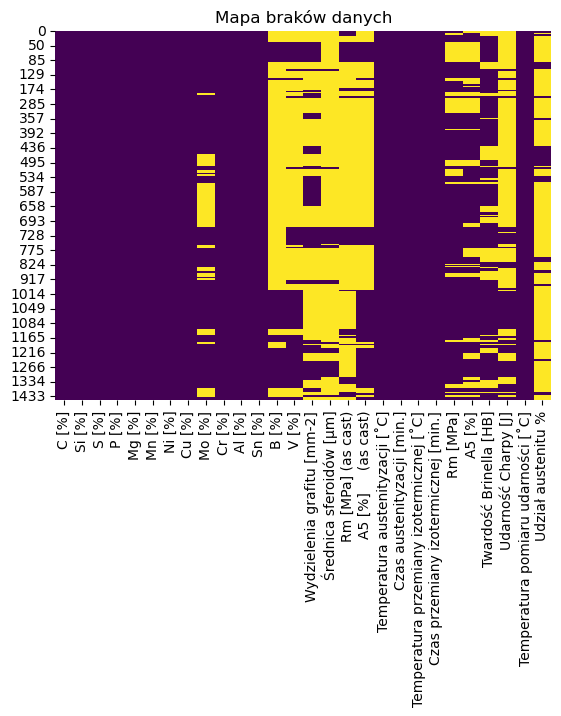

In [52]:
# procent braków w każdej kolumnie
missing_summary = data_copy.isnull().mean() * 100
print("Procent brakujących danych:\n", missing_summary)

# Wizualizacja braków danych
sns.heatmap(data_copy.isnull(), cbar=False, cmap="viridis")
plt.title("Mapa braków danych")
plt.show()

Procent brakujących danych (od największego do najmniejszego):
 Średnica sferoidów [μm]                     85.875706
Udział austenitu %                          83.954802
Rm [MPa] (as cast)                          80.338983
B [%]                                       70.056497
Udarność Charpy [J]                         69.604520
Wydzielenia grafitu [mm-2]                  63.050847
A5 [%]     (as cast)                        60.903955
V [%]                                       59.887006
A5 [%]                                      25.762712
Mo [%]                                      25.536723
Twardość Brinella [HB]                      24.519774
Rm [MPa]                                    19.435028
Temperatura austenityzacji [˚C]              0.000000
Temperatura pomiaru udarności [˚C]           0.000000
S [%]                                        0.000000
Czas przemiany izotermicznej [min.]          0.000000
Temperatura przemiany izotermicznej [˚C]     0.000000
Czas austenityzacj

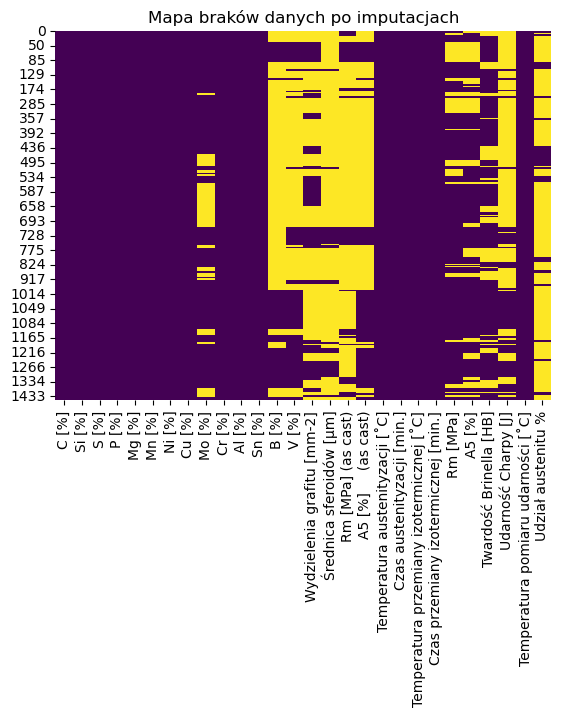

In [53]:
# Nowy procent braków w każdej kolumnie
pd.set_option('display.max_rows', None)
missing_summary = data_copy.isnull().mean() * 100
missing_summary_sorted = missing_summary.sort_values(ascending=False)
print(f"Procent brakujących danych (od największego do najmniejszego):\n {missing_summary_sorted}")

# Wizualizacja braków danych
sns.heatmap(data_copy.isnull(), cbar=False, cmap="viridis")
plt.title("Mapa braków danych po imputacjach")
plt.show()

In [54]:
pd.set_option('display.max_rows', 5)

## MICE

In [55]:
imputation_data = data_copy.copy()

In [56]:
imputation_data.drop(['A5 [%]     (as cast)', 'Rm [MPa] (as cast)'], axis=1, inplace=True)

In [57]:
# Kolumny niezależne z brakami danych
independent_missing_columns = [
    "Średnica sferoidów [μm]",
    "Udział austenitu %",
    "B [%]",
    "Udarność Charpy [J]",
    "Wydzielenia grafitu [mm-2]",
    "V [%]",
    "Mo [%]",
]

In [58]:
# Kolumny zależne (targety)
dependent_columns = [
    "Rm [MPa]",
    "A5 [%]",
    "Twardość Brinella [HB]",
    "Udarność Charpy [J]",
    "Udział austenitu %",
]

In [59]:
# Kolumny niezależne (predyktory)
independent_columns = [col for col in imputation_data.columns if col not in dependent_columns]

In [60]:
# Normalizacja danych
scaler = MinMaxScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(imputation_data), columns=imputation_data.columns)

In [61]:
# Funkcja do imputacji braków danych za pomocą MICE
def mice_imputation(df, target_columns, predictors):
    # IterativeImputer (MICE)
    imputer = IterativeImputer(max_iter=50, random_state=42)
    
    # Wybór kolumn do imputacji
    columns_to_impute = predictors + target_columns
    data_to_impute = df[columns_to_impute]
    
    # Imputacja
    imputed_data = imputer.fit_transform(data_to_impute)
    
    # Aktualizacja brakujących wartości w oryginalnej ramce danych
    df.loc[:, columns_to_impute] = imputed_data
    return df

In [62]:
# Imputacja braków danych dla zmiennych zależnych
imputation_data_copy = imputation_data.copy()
data_mice = mice_imputation(imputation_data_copy, dependent_columns, independent_columns)

In [63]:
pd.set_option('display.max_rows', None)
data_mice.isnull().mean() * 100

C [%]                                       0.0
Si [%]                                      0.0
S [%]                                       0.0
P [%]                                       0.0
Mg [%]                                      0.0
Mn [%]                                      0.0
Ni [%]                                      0.0
Cu [%]                                      0.0
Mo [%]                                      0.0
Cr [%]                                      0.0
Al [%]                                      0.0
Sn [%]                                      0.0
B [%]                                       0.0
V [%]                                       0.0
Wydzielenia grafitu [mm-2]                  0.0
Średnica sferoidów [μm]                     0.0
Temperatura austenityzacji [˚C]             0.0
Czas austenityzacji [min.]                  0.0
Temperatura przemiany izotermicznej [˚C]    0.0
Czas przemiany izotermicznej [min.]         0.0
Rm [MPa]                                

In [64]:
# Minimalne wartości kolumn
data_mice.min()

C [%]                                         3.000000
Si [%]                                        1.060000
S [%]                                         0.000000
P [%]                                         0.000000
Mg [%]                                        0.028000
Mn [%]                                        0.000000
Ni [%]                                        0.000000
Cu [%]                                        0.000000
Mo [%]                                       -5.309474
Cr [%]                                        0.000000
Al [%]                                        0.000000
Sn [%]                                        0.000000
B [%]                                        -0.386051
V [%]                                        -0.018368
Wydzielenia grafitu [mm-2]                    0.233730
Średnica sferoidów [μm]                     -23.825307
Temperatura austenityzacji [˚C]             900.000000
Czas austenityzacji [min.]                   30.000000
Temperatur

(array([  4.,   9.,  46., 164., 370., 203.,  72.,  12.,   4.,   1.]),
 array([-12.54627214,  -4.69164492,   3.16298229,  11.0176095 ,
         18.87223672,  26.72686393,  34.58149114,  42.43611836,
         50.29074557,  58.14537279,  66.        ]),
 <BarContainer object of 10 artists>)

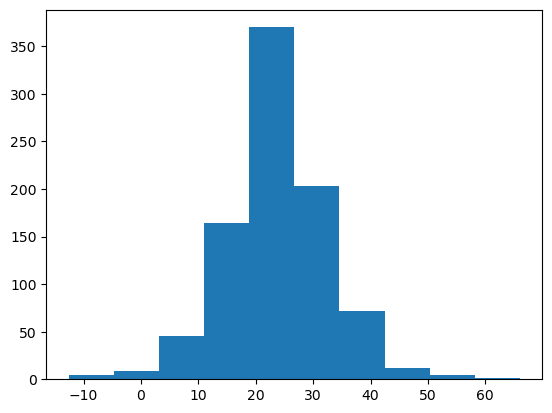

In [65]:
plt.hist(data_mice['Udział austenitu %'])

### MLPRegressor

In [66]:
# Funkcja do imputacji braków danych za pomocą MLPRegressor
def mlp_imputation(df, independent_missing_columns, dependent_columns):
    data_imputed = df.copy()
    
    # Imputacja braków danych w kolumnach niezależnych
    for target_column in independent_missing_columns:
        print(f"Imputing missing values for independent column: {target_column}")
        
        # Podział na kompletne i niekompletne dane
        complete_data = data_imputed.dropna(subset=[target_column])
        incomplete_data = data_imputed[data_imputed[target_column].isna()]
        
        if incomplete_data.empty:
            continue
        
        # Predyktory (wszystkie inne kolumny oprócz targetu)
        predictors = [col for col in data_imputed.columns if col != target_column]
        X_complete = complete_data[predictors].fillna(complete_data[predictors].mean())
        y_complete = complete_data[target_column]
        
        # Trening modelu
        model = MLPRegressor(
            hidden_layer_sizes=(100,),
            activation="relu",
            max_iter=500,
            random_state=42
        )
        model.fit(X_complete, y_complete)
        
        # Prognoza brakujących wartości
        X_incomplete = incomplete_data[predictors].fillna(complete_data[predictors].mean())
        predicted_values = model.predict(X_incomplete)
        
        # Uzupełnienie braków
        data_imputed.loc[data_imputed[target_column].isna(), target_column] = predicted_values
    
    # Imputacja braków danych w kolumnach zależnych
    for target_column in dependent_columns:
        print(f"Imputing missing values for dependent column: {target_column}")
        
        # Podział na kompletne i niekompletne dane
        complete_data = data_imputed.dropna(subset=[target_column])
        incomplete_data = data_imputed[data_imputed[target_column].isna()]
        
        if incomplete_data.empty:
            continue
        
        # Predyktory (kolumny niezależne)
        predictors = [col for col in data_imputed.columns if col != target_column]
        X_complete = complete_data[predictors].fillna(complete_data[predictors].mean())
        y_complete = complete_data[target_column]
        
        # Trening modelu
        model = MLPRegressor(
            hidden_layer_sizes=(100,),
            activation="relu",
            max_iter=500,
            random_state=42
        )
        model.fit(X_complete, y_complete)
        
        # Prognoza brakujących wartości
        X_incomplete = incomplete_data[predictors].fillna(complete_data[predictors].mean())
        predicted_values = model.predict(X_incomplete)
        
        # Uzupełnienie braków
        data_imputed.loc[data_imputed[target_column].isna(), target_column] = predicted_values
    
    return data_imputed

# Wywołanie funkcji imputacji
data_mlpr = mlp_imputation(imputation_data, independent_missing_columns, dependent_columns)


Imputing missing values for independent column: Średnica sferoidów [μm]
Imputing missing values for independent column: Udział austenitu %
Imputing missing values for independent column: B [%]
Imputing missing values for independent column: Udarność Charpy [J]


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Imputing missing values for independent column: Wydzielenia grafitu [mm-2]
Imputing missing values for independent column: V [%]
Imputing missing values for independent column: Mo [%]


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Imputing missing values for dependent column: Rm [MPa]


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Imputing missing values for dependent column: A5 [%]
Imputing missing values for dependent column: Twardość Brinella [HB]
Imputing missing values for dependent column: Udarność Charpy [J]
Imputing missing values for dependent column: Udział austenitu %


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [67]:
pd.set_option('display.max_rows', None)
data_mlpr.isnull().mean() * 100

C [%]                                       0.0
Si [%]                                      0.0
S [%]                                       0.0
P [%]                                       0.0
Mg [%]                                      0.0
Mn [%]                                      0.0
Ni [%]                                      0.0
Cu [%]                                      0.0
Mo [%]                                      0.0
Cr [%]                                      0.0
Al [%]                                      0.0
Sn [%]                                      0.0
B [%]                                       0.0
V [%]                                       0.0
Wydzielenia grafitu [mm-2]                  0.0
Średnica sferoidów [μm]                     0.0
Temperatura austenityzacji [˚C]             0.0
Czas austenityzacji [min.]                  0.0
Temperatura przemiany izotermicznej [˚C]    0.0
Czas przemiany izotermicznej [min.]         0.0
Rm [MPa]                                

### RandomForest i porównanie imputacji

In [68]:
# Funkcja do trenowania modelu i obliczania metryk
def evaluate_model(data, target_column, predictors):
    # Podział danych na zbiór treningowy i testowy
    X = data[predictors]
    y = data[target_column]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Model RandomForest
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    
    # Prognozy
    y_pred = model.predict(X_test)
    
    # Obliczanie metryk
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R2": r2}

In [69]:
# Ocena dla MICE
print("Evaluating MICE-imputed data...")
metrics_mice = {}
for target in dependent_columns:
    print(f"Evaluating target: {target}")
    metrics_mice[target] = evaluate_model(data_mice, target, independent_columns)

Evaluating MICE-imputed data...
Evaluating target: Rm [MPa]
Evaluating target: A5 [%]
Evaluating target: Twardość Brinella [HB]
Evaluating target: Udarność Charpy [J]
Evaluating target: Udział austenitu %


In [70]:
# Ocena dla MLPRegressor
print("\nEvaluating MLPRegressor-imputed data...")
metrics_mlpr = {}
for target in dependent_columns:
    print(f"Evaluating target: {target}")
    metrics_mlpr[target] = evaluate_model(data_mlpr, target, independent_columns)


Evaluating MLPRegressor-imputed data...
Evaluating target: Rm [MPa]
Evaluating target: A5 [%]
Evaluating target: Twardość Brinella [HB]
Evaluating target: Udarność Charpy [J]
Evaluating target: Udział austenitu %


In [71]:
# Porównanie wyników
print("\nComparison of Metrics:")
for target in dependent_columns:
    print(f"\nTarget: {target}")
    print(f"MICE Metrics: {metrics_mice[target]}")
    print(f"MLPRegressor Metrics: {metrics_mlpr[target]}")


Comparison of Metrics:

Target: Rm [MPa]
MICE Metrics: {'MAE': 50.53441129205872, 'MSE': 5647.499338289465, 'RMSE': 75.14984589664483, 'R2': 0.8778427292654452}
MLPRegressor Metrics: {'MAE': 46.78760862931256, 'MSE': 4749.6671230797765, 'RMSE': 68.9178287751419, 'R2': 0.8894638972230308}

Target: A5 [%]
MICE Metrics: {'MAE': 0.9809096820695687, 'MSE': 2.0322389301110233, 'RMSE': 1.4255661787903862, 'R2': 0.8231667051285345}
MLPRegressor Metrics: {'MAE': 1.1026475006663745, 'MSE': 2.6990302448843506, 'RMSE': 1.6428725589297395, 'R2': 0.768595604672483}

Target: Twardość Brinella [HB]
MICE Metrics: {'MAE': 13.175748772645811, 'MSE': 387.85138768127894, 'RMSE': 19.693942918605174, 'R2': 0.8769169255676306}
MLPRegressor Metrics: {'MAE': 13.539843588156785, 'MSE': 401.7260379218312, 'RMSE': 20.043104498101865, 'R2': 0.8697966116737552}

Target: Udarność Charpy [J]
MICE Metrics: {'MAE': 6.053491300328691, 'MSE': 106.493920666077, 'RMSE': 10.319589171380661, 'R2': 0.9247517323617402}
MLPRegr

In [72]:
# Funkcja do porównania metryk za pomocą testu Wilcoxona
def compare_metrics_wilcoxon(metrics_mice, metrics_mlpr):
    results = {}
    for target in dependent_columns:
        print(f"\nTarget: {target}")
        
        # Pobierz metryki dla MICE i MLPRegressor
        mice_values = list(metrics_mice[target].values())
        mlpr_values = list(metrics_mlpr[target].values())
        
        # Test Wilcoxona
        stat, p_value = wilcoxon(mice_values, mlpr_values)
        print(f"Wilcoxon signed-rank test: p-value = {p_value}")
        
        # Interpretacja wyników
        if p_value < 0.05:
            print("Statistically significant difference.")
            better = "MICE" if sum(mice_values) > sum(mlpr_values) else "MLPRegressor"
        else:
            print("No statistically significant difference.")
            better = "No clear winner"
        
        results[target] = {"better": better, "p-value": p_value}
    
    return results

# Porównanie wyników
comparison_results = compare_metrics_wilcoxon(metrics_mice, metrics_mlpr)

print("\nSummary of Results:")
for target, result in comparison_results.items():
    print(f"{target}: Better method = {result['better']}, p-value = {result['p-value']}")


Target: Rm [MPa]
Wilcoxon signed-rank test: p-value = 0.25
No statistically significant difference.

Target: A5 [%]
Wilcoxon signed-rank test: p-value = 0.25
No statistically significant difference.

Target: Twardość Brinella [HB]
Wilcoxon signed-rank test: p-value = 0.25
No statistically significant difference.

Target: Udarność Charpy [J]
Wilcoxon signed-rank test: p-value = 0.25
No statistically significant difference.

Target: Udział austenitu %
Wilcoxon signed-rank test: p-value = 0.125
No statistically significant difference.

Summary of Results:
Rm [MPa]: Better method = No clear winner, p-value = 0.25
A5 [%]: Better method = No clear winner, p-value = 0.25
Twardość Brinella [HB]: Better method = No clear winner, p-value = 0.25
Udarność Charpy [J]: Better method = No clear winner, p-value = 0.25
Udział austenitu %: Better method = No clear winner, p-value = 0.125


### Mieszany sposób imputacji oraz trzy modele

In [73]:
data_mix = data_copy.copy()

In [74]:
data_mix.drop(['A5 [%]     (as cast)', 'Rm [MPa] (as cast)'], axis=1, inplace=True)

In [75]:
data_mix

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Średnica sferoidów [μm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,400.0,120.0,585.00,NaN,NaN,NaN,22.0,28.70
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,385.0,120.0,701.00,NaN,NaN,NaN,22.0,37.50
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,371.0,120.0,1062.00,10.50,NaN,NaN,22.0,32.00
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,357.0,120.0,1105.00,9.60,NaN,NaN,22.0,28.50
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,343.0,120.0,1185.00,NaN,NaN,NaN,22.0,26.20
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,330.0,120.0,1277.00,NaN,NaN,NaN,22.0,17.50
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,323.0,120.0,NaN,4.00,NaN,NaN,22.0,NaN
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,316.0,120.0,1326.00,NaN,NaN,NaN,22.0,14.50
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,301.0,120.0,NaN,3.40,NaN,NaN,22.0,14.50
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,288.0,120.0,1470.00,3.10,NaN,NaN,22.0,14.00


In [76]:
def interpretation_based_imputation(df, variable_strategies):
    df = df.copy()
    
    # Imputacja dla zmiennych zależnych od złożonych procesów fizycznych
    for col in variable_strategies.get("complex_physics", []):
        imputer = IterativeImputer(estimator=RandomForestRegressor(), max_iter=100, random_state=123, min_value=0)
        df[[col]] = imputer.fit_transform(df[[col]])
    
    # Imputacja dla zmiennych opisujących skład chemiczny
    for col in variable_strategies.get("chemical_composition", []):
        imputer = IterativeImputer(estimator=CatBoostRegressor(verbose=0, random_state=42), max_iter=50, min_value=0)
        df[[col]] = imputer.fit_transform(df[[col]])
    
    # Imputacja dla zmiennych procentowych
    for col in variable_strategies.get("percentages", []):
        n_samples = len(df)
        quantile_transformer = QuantileTransformer(output_distribution='uniform', n_quantiles=min(n_samples, 1000), random_state=42)
        transformed = quantile_transformer.fit_transform(df[[col]])
        imputer = IterativeImputer(estimator=RandomForestRegressor(), max_iter=50, random_state=42, min_value=0)
        imputed = imputer.fit_transform(transformed)
        df[[col]] = quantile_transformer.inverse_transform(imputed)
    
    # Imputacja dla zmiennych jakościowych
    for col in variable_strategies.get("qualitative", []):
        imputer = KNNImputer(n_neighbors=5)
        df[[col]] = imputer.fit_transform(df[[col]])
    
    # Imputacja dla zmiennych z kategorii "other"
    for col in variable_strategies.get("other", []):
        imputer = KNNImputer(n_neighbors=3)
        df[[col]] = imputer.fit_transform(df[[col]])
            
    return df

In [77]:
variable_strategies = {
    "complex_physics": [
        "Rm [MPa]",
        "A5 [%]",
        "Twardość Brinella [HB]"
    ],
    "chemical_composition": [
        "C [%]", "Si [%]", "S [%]", "P [%]", "Mg [%]", "Mn [%]",
        "Ni [%]", "Cu [%]", "Mo [%]", "Cr [%]", "Al [%]", "Sn [%]",
        "B [%]", "V [%]"
    ],
    #"percentages": [
    #    "Udział austenitu %"
    #],
    "qualitative": [
        "Temperatura pomiaru udarności [˚C]",
        "Temperatura austenityzacji [˚C]",
        "Czas austenityzacji [min.]",
        "Temperatura przemiany izotermicznej [˚C]",
        "Czas przemiany izotermicznej [min.]"
    ],
    "other": [
        "Wydzielenia grafitu [mm-2]",
        "Średnica sferoidów [μm]"
    ]
}

In [78]:
mlp_imputation(data_mix, [], ["Udział austenitu %"])

Imputing missing values for dependent column: Udział austenitu %


,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Średnica sferoidów [μm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,400.0,120.0,585.00,NaN,NaN,NaN,22.0,28.700000
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,385.0,120.0,701.00,NaN,NaN,NaN,22.0,37.500000
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,371.0,120.0,1062.00,10.50,NaN,NaN,22.0,32.000000
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,357.0,120.0,1105.00,9.60,NaN,NaN,22.0,28.500000
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,343.0,120.0,1185.00,NaN,NaN,NaN,22.0,26.200000
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,330.0,120.0,1277.00,NaN,NaN,NaN,22.0,17.500000
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,323.0,120.0,NaN,4.00,NaN,NaN,22.0,96.556178
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,316.0,120.0,1326.00,NaN,NaN,NaN,22.0,14.500000
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,301.0,120.0,NaN,3.40,NaN,NaN,22.0,14.500000
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001,0.0001,0.0001,0.0001,NaN,NaN,NaN,NaN,927.0,120.0,288.0,120.0,1470.00,3.10,NaN,NaN,22.0,14.000000


In [79]:
imputed_data_mix = interpretation_based_imputation(data_mix, variable_strategies)

In [80]:
imputed_data_mix.isnull().mean() * 100

C [%]                                        0.000000
Si [%]                                       0.000000
S [%]                                        0.000000
P [%]                                        0.000000
Mg [%]                                       0.000000
Mn [%]                                       0.000000
Ni [%]                                       0.000000
Cu [%]                                       0.000000
Mo [%]                                       0.000000
Cr [%]                                       0.000000
Al [%]                                       0.000000
Sn [%]                                       0.000000
B [%]                                        0.000000
V [%]                                        0.000000
Wydzielenia grafitu [mm-2]                   0.000000
Średnica sferoidów [μm]                      0.000000
Temperatura austenityzacji [˚C]              0.000000
Czas austenityzacji [min.]                   0.000000
Temperatura przemiany izoter

In [81]:
# Imputacja udziału austenitu i udarności Charpy z użyciem odpowiednio MICE i MLP
# (Sprawdzono, że inne metody prawie zawsze zwracają jedną wartość)

imputed_data_mix = mice_imputation(imputed_data_mix, ["Udział austenitu %"], independent_columns)
imputed_data_mix["Udział austenitu %"] = imputed_data_mix["Udział austenitu %"].clip(lower=0.0)
imputed_data_mix["Udział austenitu %"] = imputed_data_mix["Udział austenitu %"].clip(upper=100.0)

imputed_data_mix = mlp_imputation(imputed_data_mix, [], ["Udarność Charpy [J]"])
imputed_data_mix["Udarność Charpy [J]"] = imputed_data_mix["Udarność Charpy [J]"].clip(lower=0.1)

Imputing missing values for dependent column: Udarność Charpy [J]


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [82]:
independent_columns

['C [%]',
 'Si [%]',
 'S [%]',
 'P [%]',
 'Mg [%]',
 'Mn [%]',
 'Ni [%]',
 'Cu [%]',
 'Mo [%]',
 'Cr [%]',
 'Al [%]',
 'Sn [%]',
 'B [%]',
 'V [%]',
 'Wydzielenia grafitu [mm-2]',
 'Średnica sferoidów [μm]',
 'Temperatura austenityzacji [˚C]',
 'Czas austenityzacji [min.]',
 'Temperatura przemiany izotermicznej [˚C]',
 'Czas przemiany izotermicznej [min.]',
 'Temperatura pomiaru udarności [˚C]']

In [83]:
imputed_data_mix

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Średnica sferoidów [μm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Udział austenitu %
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,400.0,120.0,585.000000,6.045251,353.439572,37.796083,22.0,28.700000
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,385.0,120.0,701.000000,6.045251,353.439572,48.502772,22.0,37.500000
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,371.0,120.0,1062.000000,10.500000,353.439572,80.550210,22.0,32.000000
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,357.0,120.0,1105.000000,9.600000,353.439572,83.963035,22.0,28.500000
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,343.0,120.0,1185.000000,6.045251,353.439572,88.467192,22.0,26.200000
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,330.0,120.0,1277.000000,6.045251,353.439572,87.577177,22.0,17.500000
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,323.0,120.0,1155.399509,4.000000,353.439572,89.397043,22.0,22.494789
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,316.0,120.0,1326.000000,6.045251,353.439572,80.398216,22.0,14.500000
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,301.0,120.0,1155.399509,3.400000,353.439572,90.224556,22.0,14.500000
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,288.0,120.0,1470.000000,3.100000,353.439572,63.746790,22.0,14.000000


In [84]:
imputed_data_mix.isnull().mean() * 100

C [%]                                       0.0
Si [%]                                      0.0
S [%]                                       0.0
P [%]                                       0.0
Mg [%]                                      0.0
Mn [%]                                      0.0
Ni [%]                                      0.0
Cu [%]                                      0.0
Mo [%]                                      0.0
Cr [%]                                      0.0
Al [%]                                      0.0
Sn [%]                                      0.0
B [%]                                       0.0
V [%]                                       0.0
Wydzielenia grafitu [mm-2]                  0.0
Średnica sferoidów [μm]                     0.0
Temperatura austenityzacji [˚C]             0.0
Czas austenityzacji [min.]                  0.0
Temperatura przemiany izotermicznej [˚C]    0.0
Czas przemiany izotermicznej [min.]         0.0
Rm [MPa]                                

(array([ 23.,  43., 243., 364., 154.,  44.,   8.,   3.,   2.,   1.]),
 array([ 2.5 ,  8.85, 15.2 , 21.55, 27.9 , 34.25, 40.6 , 46.95, 53.3 ,
        59.65, 66.  ]),
 <BarContainer object of 10 artists>)

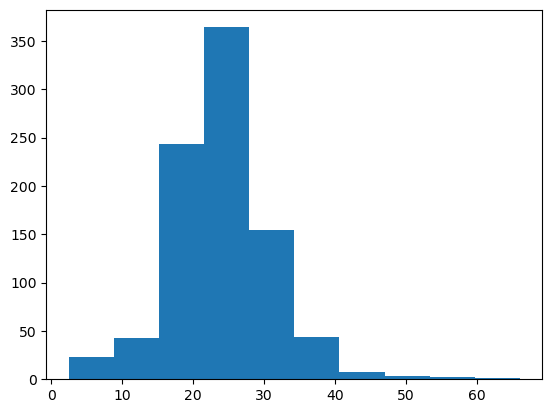

In [85]:
plt.hist(imputed_data_mix['Udział austenitu %'])

(array([ 46.,  44.,  70., 114., 242., 222.,  90.,  32.,  20.,   5.]),
 array([1.0000e-01, 1.5790e+01, 3.1480e+01, 4.7170e+01, 6.2860e+01,
        7.8550e+01, 9.4240e+01, 1.0993e+02, 1.2562e+02, 1.4131e+02,
        1.5700e+02]),
 <BarContainer object of 10 artists>)

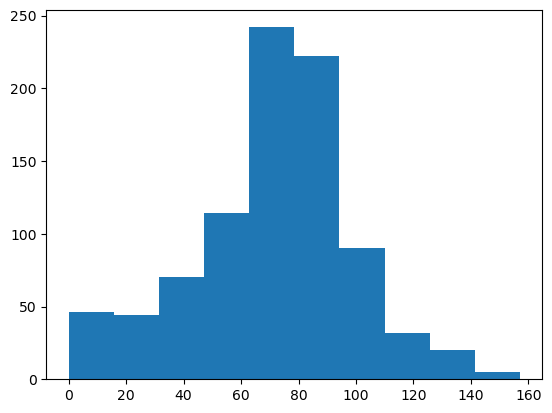

In [86]:
plt.hist(imputed_data_mix['Udarność Charpy [J]'])

In [87]:
imputed_data_mix.columns = [re.sub(r'[^a-zA-Z0-9_]', '_', unidecode.unidecode(col)) for col in imputed_data_mix.columns]
dependent_columns_lgb = [re.sub(r'[^a-zA-Z0-9_]', '_', unidecode.unidecode(col)) for col in dependent_columns]

In [88]:
imputed_data_mix

,C____,Si____,S____,P____,Mg____,Mn____,Ni____,Cu____,Mo____,Cr____,Al____,Sn____,B____,V____,Wydzielenia_grafitu__mm_2_,Srednica_sferoidow__mm_,Temperatura_austenityzacji___C_,Czas_austenityzacji__min__,Temperatura_przemiany_izotermicznej___C_,Czas_przemiany_izotermicznej__min__,Rm__MPa_,A5____,Twardosc_Brinella__HB_,Udarnosc_Charpy__J_,Temperatura_pomiaru_udarnosci___C_,Udzial_austenitu__
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,400.0,120.0,585.000000,6.045251,353.439572,37.796083,22.0,28.700000
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,385.0,120.0,701.000000,6.045251,353.439572,48.502772,22.0,37.500000
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,371.0,120.0,1062.000000,10.500000,353.439572,80.550210,22.0,32.000000
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,357.0,120.0,1105.000000,9.600000,353.439572,83.963035,22.0,28.500000
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,343.0,120.0,1185.000000,6.045251,353.439572,88.467192,22.0,26.200000
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,330.0,120.0,1277.000000,6.045251,353.439572,87.577177,22.0,17.500000
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,323.0,120.0,1155.399509,4.000000,353.439572,89.397043,22.0,22.494789
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,316.0,120.0,1326.000000,6.045251,353.439572,80.398216,22.0,14.500000
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,301.0,120.0,1155.399509,3.400000,353.439572,90.224556,22.0,14.500000
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,288.0,120.0,1470.000000,3.100000,353.439572,63.746790,22.0,14.000000


In [89]:
imputed_data_mix.shape

(885, 26)

In [90]:
imputed_data_mix.columns

Index(['C____', 'Si____', 'S____', 'P____', 'Mg____', 'Mn____', 'Ni____',
       'Cu____', 'Mo____', 'Cr____', 'Al____', 'Sn____', 'B____', 'V____',
       'Wydzielenia_grafitu__mm_2_', 'Srednica_sferoidow__mm_',
       'Temperatura_austenityzacji___C_', 'Czas_austenityzacji__min__',
       'Temperatura_przemiany_izotermicznej___C_',
       'Czas_przemiany_izotermicznej__min__', 'Rm__MPa_', 'A5____',
       'Twardosc_Brinella__HB_', 'Udarnosc_Charpy__J_',
       'Temperatura_pomiaru_udarnosci___C_', 'Udzial_austenitu__'],
      dtype='object')

In [91]:
kolumny = ['C____', 'Si____', 'S____', 'P____', 'Mg____', 'Mn____', 'Ni____',
       'Cu____', 'Mo____', 'Cr____', 'Al____', 'Sn____', 'B____', 'V____',
       'Wydzielenia_grafitu__mm_2_', 'Srednica_sferoidow__mm_',
       'Temperatura_austenityzacji___C_', 'Czas_austenityzacji__min__',
       'Temperatura_przemiany_izotermicznej___C_',
       'Czas_przemiany_izotermicznej__min__', 'Rm__MPa_', 'A5____',
       'Twardosc_Brinella__HB_', 'Udarnosc_Charpy__J_',
       'Temperatura_pomiaru_udarnosci___C_', 'Udzial_austenitu__']
for i in kolumny:
    print(i, min(imputed_data_mix[i]))

C____ 3.0
Si____ 1.06
S____ 0.0
P____ 0.0
Mg____ 0.028
Mn____ 0.0
Ni____ 0.0
Cu____ 0.0
Mo____ 0.0
Cr____ 0.0
Al____ 0.0
Sn____ 0.0
B____ 0.0
V____ -0.01567478886340012
Wydzielenia_grafitu__mm_2_ 37.0
Srednica_sferoidow__mm_ 3.0
Temperatura_austenityzacji___C_ 900.0
Czas_austenityzacji__min__ 30.0
Temperatura_przemiany_izotermicznej___C_ 230.0
Czas_przemiany_izotermicznej__min__ 0.0
Rm__MPa_ 500.0
A5____ 0.0
Twardosc_Brinella__HB_ 191.97600000000003
Udarnosc_Charpy__J_ 0.1
Temperatura_pomiaru_udarnosci___C_ -100.0
Udzial_austenitu__ 2.5


In [92]:
imputed_data_mix['V____'] = imputed_data_mix['V____'].clip(lower=0)

In [94]:
imputed_data_mix

,C____,Si____,S____,P____,Mg____,Mn____,Ni____,Cu____,Mo____,Cr____,Al____,Sn____,B____,V____,Wydzielenia_grafitu__mm_2_,Srednica_sferoidow__mm_,Temperatura_austenityzacji___C_,Czas_austenityzacji__min__,Temperatura_przemiany_izotermicznej___C_,Czas_przemiany_izotermicznej__min__,Rm__MPa_,A5____,Twardosc_Brinella__HB_,Udarnosc_Charpy__J_,Temperatura_pomiaru_udarnosci___C_,Udzial_austenitu__
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,400.0,120.0,585.000000,6.045251,353.439572,37.796083,22.0,28.700000
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,385.0,120.0,701.000000,6.045251,353.439572,48.502772,22.0,37.500000
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,371.0,120.0,1062.000000,10.500000,353.439572,80.550210,22.0,32.000000
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,357.0,120.0,1105.000000,9.600000,353.439572,83.963035,22.0,28.500000
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,343.0,120.0,1185.000000,6.045251,353.439572,88.467192,22.0,26.200000
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,330.0,120.0,1277.000000,6.045251,353.439572,87.577177,22.0,17.500000
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,323.0,120.0,1155.399509,4.000000,353.439572,89.397043,22.0,22.494789
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,316.0,120.0,1326.000000,6.045251,353.439572,80.398216,22.0,14.500000
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,301.0,120.0,1155.399509,3.400000,353.439572,90.224556,22.0,14.500000
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,288.0,120.0,1470.000000,3.100000,353.439572,63.746790,22.0,14.000000


## Przygotowanie modelu - Rm [MPa] 

In [95]:
y = imputed_data_mix['Rm__MPa_']
X = imputed_data_mix.drop('Rm__MPa_', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### Grid Search

In [96]:
rf = RandomForestRegressor(random_state=42)

param_grid_rf = {
    'n_estimators': [20, 50, 100, 200, 400],
    'max_depth': [None, 10, 20, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Optymalizacja hiperparametrów
grid_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_rf.fit(X_train, y_train)

# Wyniki
print("Najlepsze hiperparametry dla Random Forest:", grid_rf.best_params_)
rf_best = grid_rf.best_estimator_
y_pred_rf = rf_best.predict(X_test)
print("RMSE dla Random Forest:", mean_squared_error(y_test, y_pred_rf, squared=False))

Fitting 4 folds for each of 180 candidates, totalling 720 fits
Najlepsze hiperparametry dla Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}
RMSE dla Random Forest: 67.26115436428624


In [97]:
xgb = XGBRegressor(random_state=42)

# Siatka hiperparametrów
param_grid_xgb = {
    'n_estimators': [20, 50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 6, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Optymalizacja hiperparametrów
grid_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_xgb.fit(X_train, y_train)

# Wyniki
print("Najlepsze hiperparametry dla XGBoost:", grid_xgb.best_params_)
xgb_best = grid_xgb.best_estimator_
y_pred_xgb = xgb_best.predict(X_test)
print("RMSE dla XGBoost:", mean_squared_error(y_test, y_pred_xgb, squared=False))

Fitting 4 folds for each of 540 candidates, totalling 2160 fits
Najlepsze hiperparametry dla XGBoost: {'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 300, 'subsample': 0.6}
RMSE dla XGBoost: 58.66540306142114


In [98]:
LGBmodel = lgb.LGBMRegressor(random_state=42)

# Siatka hiperparametrów
param_grid_lgb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'num_leaves' : [10, 25],
    'max_depth' : [-1, 5, 10],
    'subsample' : [0.6, 0.8, 1.0],
    'colsample_bytree' : [0.6, 0.8, 1.0],
    'min_child_samples' : [10, 20]
}

# Optymalizacja hiperparametrów
grid_lgb = GridSearchCV(estimator=LGBmodel, param_grid=param_grid_lgb, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_lgb.fit(X_train, y_train)

# Wyniki
print("Najlepsze hiperparametry dla LGB:", grid_lgb.best_params_)
lgb_best = grid_lgb.best_estimator_
y_pred_lgb = lgb_best.predict(X_test)
print("RMSE dla XGBoost:", mean_squared_error(y_test, y_pred_lgb, squared=False))

Fitting 4 folds for each of 648 candidates, totalling 2592 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1202
[LightGBM] [Info] Number of data points in the train set: 708, number of used features: 25
[LightGBM] [Info] Start training from score 1146.258978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

#### Bayes Search

In [99]:
rf = RandomForestRegressor(random_state=42)

param_space_rf = {
    'n_estimators': (20, 500),         # Liczba drzew
    'max_depth': (5, 60),              # Maksymalna głębokość drzewa
    'min_samples_split': (2, 20),      # Minimalna liczba próbek do podziału
    'min_samples_leaf': (1, 10),       # Minimalna liczba próbek w liściu
}

# Bayes Search
bayes_rf = BayesSearchCV(
    estimator=rf,
    search_spaces=param_space_rf,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=1
)

# Dopasowanie modelu
bayes_rf.fit(X_train, y_train)

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

BayesSearchCV(cv=4, estimator=RandomForestRegressor(random_state=42),
              random_state=42, scoring='neg_mean_squared_error',
              search_spaces={'max_depth': (5, 60), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 20),
                             'n_estimators': (20, 500)},
              verbose=1)

In [100]:
# Wyniki dla Random Forest
print("Najlepsze hiperparametry dla Random Forest:", bayes_rf.best_params_)
rf_best_b = bayes_rf.best_estimator_
y_pred_rf_b = rf_best_b.predict(X_test)
print("RMSE dla Random Forest:", mean_squared_error(y_test, y_pred_rf_b, squared=False))

Najlepsze hiperparametry dla Random Forest: OrderedDict([('max_depth', 60), ('min_samples_leaf', 1), ('min_samples_split', 2), ('n_estimators', 459)])
RMSE dla Random Forest: 67.62598528191056


In [101]:
xgb = XGBRegressor(random_state=42)

param_space_xgb = {
    'n_estimators': (20, 500),                     # Liczba iteracji boostingu
    'learning_rate': (0.01, 0.25, 'log-uniform'),  # Współczynnik uczenia (logarytmiczna skala)
    'max_depth': (3, 20),                          # Maksymalna głębokość drzewa
    'subsample': (0.6, 1.0),                       # Procent próbek używanych na drzewo
    'colsample_bytree': (0.6, 1.0),                # Procent kolumn używanych na drzewo
}

bayes_xgb = BayesSearchCV(
    estimator=xgb,
    search_spaces=param_space_xgb,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=1
)

# Dopasowanie modelu
bayes_xgb.fit(X_train, y_train)


Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

BayesSearchCV(cv=4,
              estimator=XGBRegressor(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
              random_state=42, scoring='neg_mean_squared_error',
              search_spaces={'colsample_bytree': (0.6, 1.0),
                             'learning_rate': (0.01, 0.25, 'log-uniform'),
                             'max_depth': (3, 20), 'n_estimators': (20, 500),
                             'subsample': (0.6, 1.0)},
              verbose=1)

In [102]:
# Wyniki dla XGBoost
print("Najlepsze hiperparametry dla XGBoost:", bayes_xgb.best_params_)
xgb_best_b = bayes_xgb.best_estimator_
y_pred_xgb_b = xgb_best_b.predict(X_test)
print("RMSE dla XGBoost:", mean_squared_error(y_test, y_pred_xgb_b, squared=False))

Najlepsze hiperparametry dla XGBoost: OrderedDict([('colsample_bytree', 0.8936112071942273), ('learning_rate', 0.20567548928524068), ('max_depth', 6), ('n_estimators', 110), ('subsample', 0.920201292582698)])
RMSE dla XGBoost: 59.64822998696487


In [103]:
LGBmodel = lgb.LGBMRegressor(random_state=42)

# Zakres hiperparametrów dla Bayes Search
param_space_lgb = {
    'n_estimators': (50, 500),                    # Liczba iteracji boostingu
    'learning_rate': (0.01, 0.3, 'log-uniform'),  # Współczynnik uczenia (skala logarytmiczna)
    'num_leaves': (10, 100),                      # Liczba liści w każdym drzewie
    'max_depth': (-1, 20),                        # Maksymalna głębokość drzewa (-1 oznacza brak limitu)
    'subsample': (0.6, 1.0),                      # Procent próbek używanych na drzewo
    'colsample_bytree': (0.6, 1.0),               # Procent kolumn używanych na drzewo
    'min_child_samples': (5, 50),                 # Minimalna liczba próbek w liściu
    'reg_alpha': (0.0, 1.0, 'uniform'),           # Reguła L1
    'reg_lambda': (0.0, 1.0, 'uniform')           # Reguła L2
}

# Bayes Search
bayes_lgb = BayesSearchCV(
    estimator=LGBmodel,
    search_spaces=param_space_lgb,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=False
)

# Dopasowanie modelu
bayes_lgb.fit(X_train, y_train)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1013
[LightGBM] [Info] Number of data points in the train set: 531, number of used features: 25
[LightGBM] [Info] Start training from score 1144.523791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

BayesSearchCV(cv=4, estimator=LGBMRegressor(random_state=42), random_state=42,
              scoring='neg_mean_squared_error',
              search_spaces={'colsample_bytree': (0.6, 1.0),
                             'learning_rate': (0.01, 0.3, 'log-uniform'),
                             'max_depth': (-1, 20),
                             'min_child_samples': (5, 50),
                             'n_estimators': (50, 500), 'num_leaves': (10, 100),
                             'reg_alpha': (0.0, 1.0, 'uniform'),
                             'reg_lambda': (0.0, 1.0, 'uniform'),
                             'subsample': (0.6, 1.0)},
              verbose=False)

In [104]:
# Wyniki dla LGB
print("Najlepsze hiperparametry dla LightGBM:", bayes_lgb.best_params_)
lgb_best_b = bayes_lgb.best_estimator_
y_pred_lgb_b = lgb_best_b.predict(X_test)
print("RMSE dla LightGBM:", mean_squared_error(y_test, y_pred_lgb_b, squared=False))

Najlepsze hiperparametry dla LightGBM: OrderedDict([('colsample_bytree', 0.7757315282580075), ('learning_rate', 0.10655079534166445), ('max_depth', 20), ('min_child_samples', 23), ('n_estimators', 369), ('num_leaves', 38), ('reg_alpha', 0.26878702864103066), ('reg_lambda', 0.7259011842731327), ('subsample', 0.7409555923688491)])
RMSE dla LightGBM: 60.56231465153198


## Podsumowanie i ocena modeli - Rm [MPa]

In [105]:
def evaluate_model(model, y_test, preds):
    print("Mean Squared Error:", mean_squared_error(y_test, preds))
    print("Root Mean Squared Error:", mean_squared_error(y_test, preds, squared=False))
    print("Mean Absolute Error:", mean_absolute_error(y_test, preds))
    print("R² Score:", r2_score(y_test, preds))
    print("-" * 50)

In [106]:
modele = [rf_best, rf_best_b, xgb_best, xgb_best_b, lgb_best, lgb_best_b]
predykcje = [y_pred_rf, y_pred_rf_b, y_pred_xgb, y_pred_xgb_b, y_pred_lgb, y_pred_lgb_b]
nazwy = ['Random Forest (Grid)', 'Random Forest (Bayes)', 'XGB (Grid)', 'XGB (Bayes)', 'LGB (Grid)', 'LGB (Bayes)']

In [107]:
for i in range(0, len(modele)):
    print("Wyniki dla", nazwy[i], ": ")
    evaluate_model(modele[i], y_test, predykcje[i])

Wyniki dla Random Forest (Grid) : 
Mean Squared Error: 4524.062886416343
Root Mean Squared Error: 67.26115436428624
Mean Absolute Error: 40.03767058799042
R² Score: 0.8876962903709603
--------------------------------------------------
Wyniki dla Random Forest (Bayes) : 
Mean Squared Error: 4573.273885349184
Root Mean Squared Error: 67.62598528191056
Mean Absolute Error: 40.15250721835813
R² Score: 0.8864746942363657
--------------------------------------------------
Wyniki dla XGB (Grid) : 
Mean Squared Error: 3441.6295163590003
Root Mean Squared Error: 58.66540306142114
Mean Absolute Error: 36.59313238500193
R² Score: 0.9145662269601917
--------------------------------------------------
Wyniki dla XGB (Bayes) : 
Mean Squared Error: 3557.9113405778553
Root Mean Squared Error: 59.64822998696487
Mean Absolute Error: 35.61544403809604
R² Score: 0.9116796887864146
--------------------------------------------------
Wyniki dla LGB (Grid) : 
Mean Squared Error: 4011.1993599734374
Root Mean Sq

In [108]:
# XGB (Grid) - najlepszy model wg MSE (3441), RMSE (58.66) i R2 (0.915)
# XGB (Bayes) - najlepszy model wg MAE (35.61)

grid_xgb.best_params_

{'colsample_bytree': 1.0,
 'learning_rate': 0.05,
 'max_depth': 6,
 'n_estimators': 300,
 'subsample': 0.6}

In [109]:
"""
{'colsample_bytree': 1.0,
 'learning_rate': 0.05,
 'max_depth': 6,
 'n_estimators': 300,
 'subsample': 0.6}
"""

"\n{'colsample_bytree': 1.0,\n 'learning_rate': 0.05,\n 'max_depth': 6,\n 'n_estimators': 300,\n 'subsample': 0.6}\n"

In [110]:
bayes_xgb.best_params_

OrderedDict([('colsample_bytree', 0.8936112071942273),
             ('learning_rate', 0.20567548928524068),
             ('max_depth', 6),
             ('n_estimators', 110),
             ('subsample', 0.920201292582698)])

In [111]:
"""
[('colsample_bytree', 0.8936112071942273),
             ('learning_rate', 0.20567548928524068),
             ('max_depth', 6),
             ('n_estimators', 110),
             ('subsample', 0.920201292582698)]
"""

"\n[('colsample_bytree', 0.8936112071942273),\n             ('learning_rate', 0.20567548928524068),\n             ('max_depth', 6),\n             ('n_estimators', 110),\n             ('subsample', 0.920201292582698)]\n"

## Przygotowanie modelu - Udarność Charpy [J]

In [112]:
y2 = imputed_data_mix['Udarnosc_Charpy__J_']
X2 = imputed_data_mix.drop('Udarnosc_Charpy__J_', axis=1)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=24)

#### Grid Search

In [113]:
rf = RandomForestRegressor(random_state=42)

param_grid_rf = {
    'n_estimators': [20, 50, 100, 200, 400],
    'max_depth': [None, 10, 20, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Optymalizacja hiperparametrów
grid_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_rf.fit(X_train2, y_train2)

# Wyniki
print("Najlepsze hiperparametry dla Random Forest:", grid_rf.best_params_)
rf_best = grid_rf.best_estimator_
y_pred_rf = rf_best.predict(X_test2)
print("RMSE dla Random Forest:", mean_squared_error(y_test2, y_pred_rf, squared=False))

Fitting 4 folds for each of 180 candidates, totalling 720 fits
Najlepsze hiperparametry dla Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
RMSE dla Random Forest: 13.73686443285086


In [114]:
xgb = XGBRegressor(random_state=42)

# Siatka hiperparametrów
param_grid_xgb = {
    'n_estimators': [20, 50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 6, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Optymalizacja hiperparametrów
grid_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_xgb.fit(X_train2, y_train2)

# Wyniki
print("Najlepsze hiperparametry dla XGBoost:", grid_xgb.best_params_)
xgb_best = grid_xgb.best_estimator_
y_pred_xgb = xgb_best.predict(X_test2)
print("RMSE dla XGBoost:", mean_squared_error(y_test2, y_pred_xgb, squared=False))

Fitting 4 folds for each of 540 candidates, totalling 2160 fits
Najlepsze hiperparametry dla XGBoost: {'colsample_bytree': 0.6, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 200, 'subsample': 0.6}
RMSE dla XGBoost: 12.110850400709202


In [120]:
LGBmodel = lgb.LGBMRegressor(random_state=42)

# Siatka hiperparametrów
param_grid_lgb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'num_leaves' : [10, 25],
    'max_depth' : [-1, 5, 10],
    'subsample' : [0.6, 0.8, 1.0],
    'colsample_bytree' : [0.6, 0.8, 1.0],
    'min_child_samples' : [10, 20]
}

# Optymalizacja hiperparametrów
grid_lgb = GridSearchCV(estimator=LGBmodel, param_grid=param_grid_lgb, cv=4, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_lgb.fit(X_train2, y_train2)

# Wyniki
print("Najlepsze hiperparametry dla LGB:", grid_lgb.best_params_)
lgb_best = grid_lgb.best_estimator_
y_pred_lgb = lgb_best.predict(X_test2)
print("RMSE dla XGBoost:", mean_squared_error(y_test2, y_pred_lgb, squared=False))

Fitting 4 folds for each of 648 candidates, totalling 2592 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1194
[LightGBM] [Info] Number of data points in the train set: 708, number of used features: 25
[LightGBM] [Info] Start training from score 71.430791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

### Bayes Search

In [121]:
rf = RandomForestRegressor(random_state=42)

param_space_rf = {
    'n_estimators': (20, 500),         # Liczba drzew
    'max_depth': (5, 60),              # Maksymalna głębokość drzewa
    'min_samples_split': (2, 20),      # Minimalna liczba próbek do podziału
    'min_samples_leaf': (1, 10),       # Minimalna liczba próbek w liściu
}

# Bayes Search
bayes_rf = BayesSearchCV(
    estimator=rf,
    search_spaces=param_space_rf,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=1
)

# Dopasowanie modelu
bayes_rf.fit(X_train2, y_train2)

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

BayesSearchCV(cv=4, estimator=RandomForestRegressor(random_state=42),
              random_state=42, scoring='neg_mean_squared_error',
              search_spaces={'max_depth': (5, 60), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 20),
                             'n_estimators': (20, 500)},
              verbose=1)

In [122]:
# Wyniki dla Random Forest
print("Najlepsze hiperparametry dla Random Forest:", bayes_rf.best_params_)
rf_best_b = bayes_rf.best_estimator_
y_pred_rf_b = rf_best_b.predict(X_test2)
print("RMSE dla Random Forest:", mean_squared_error(y_test2, y_pred_rf_b, squared=False))

Najlepsze hiperparametry dla Random Forest: OrderedDict([('max_depth', 60), ('min_samples_leaf', 1), ('min_samples_split', 2), ('n_estimators', 159)])
RMSE dla Random Forest: 13.953278056729452


In [123]:
xgb = XGBRegressor(random_state=42)

param_space_xgb = {
    'n_estimators': (20, 500),                     # Liczba iteracji boostingu
    'learning_rate': (0.01, 0.25, 'log-uniform'),  # Współczynnik uczenia (logarytmiczna skala)
    'max_depth': (3, 20),                          # Maksymalna głębokość drzewa
    'subsample': (0.6, 1.0),                       # Procent próbek używanych na drzewo
    'colsample_bytree': (0.6, 1.0),                # Procent kolumn używanych na drzewo
}

bayes_xgb = BayesSearchCV(
    estimator=xgb,
    search_spaces=param_space_xgb,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=1
)

# Dopasowanie modelu
bayes_xgb.fit(X_train2, y_train2)

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fits
Fitting 4 folds for each of 1 candidates, totalling 4 fi

BayesSearchCV(cv=4,
              estimator=XGBRegressor(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
              random_state=42, scoring='neg_mean_squared_error',
              search_spaces={'colsample_bytree': (0.6, 1.0),
                             'learning_rate': (0.01, 0.25, 'log-uniform'),
                             'max_depth': (3, 20), 'n_estimators': (20, 500),
                             'subsample': (0.6, 1.0)},
              verbose=1)

In [124]:
# Wyniki dla XGBoost
print("Najlepsze hiperparametry dla XGBoost:", bayes_xgb.best_params_)
xgb_best_b = bayes_xgb.best_estimator_
y_pred_xgb_b = xgb_best_b.predict(X_test2)
print("RMSE dla XGBoost:", mean_squared_error(y_test2, y_pred_xgb_b, squared=False))

Najlepsze hiperparametry dla XGBoost: OrderedDict([('colsample_bytree', 0.6), ('learning_rate', 0.026163862285111333), ('max_depth', 20), ('n_estimators', 486), ('subsample', 0.6)])
RMSE dla XGBoost: 11.734273808275484


In [125]:
LGBmodel = lgb.LGBMRegressor(random_state=42)

# Zakres hiperparametrów dla Bayes Search
param_space_lgb = {
    'n_estimators': (50, 500),              # Liczba iteracji boostingu
    'learning_rate': (0.01, 0.3, 'log-uniform'),  # Współczynnik uczenia (skala logarytmiczna)
    'num_leaves': (10, 100),               # Liczba liści w każdym drzewie
    'max_depth': (-1, 20),                 # Maksymalna głębokość drzewa (-1 oznacza brak limitu)
    'subsample': (0.6, 1.0),               # Procent próbek używanych na drzewo
    'colsample_bytree': (0.6, 1.0),        # Procent kolumn używanych na drzewo
    'min_child_samples': (5, 50),          # Minimalna liczba próbek w liściu
    'reg_alpha': (0.0, 1.0, 'uniform'),    # Reguła L1
    'reg_lambda': (0.0, 1.0, 'uniform')    # Reguła L2
}

# Bayes Search
bayes_lgb = BayesSearchCV(
    estimator=LGBmodel,
    search_spaces=param_space_lgb,
    n_iter=50,  # Liczba iteracji Bayes Search
    cv=4,       # 4-krotna walidacja krzyżowa
    scoring='neg_mean_squared_error',
    random_state=42,
    verbose=False
)

# Dopasowanie modelu
bayes_lgb.fit(X_train2, y_train2)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 945
[LightGBM] [Info] Number of data points in the train set: 531, number of used features: 25
[LightGBM] [Info] Start training from score 71.411816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

BayesSearchCV(cv=4, estimator=LGBMRegressor(random_state=42), random_state=42,
              scoring='neg_mean_squared_error',
              search_spaces={'colsample_bytree': (0.6, 1.0),
                             'learning_rate': (0.01, 0.3, 'log-uniform'),
                             'max_depth': (-1, 20),
                             'min_child_samples': (5, 50),
                             'n_estimators': (50, 500), 'num_leaves': (10, 100),
                             'reg_alpha': (0.0, 1.0, 'uniform'),
                             'reg_lambda': (0.0, 1.0, 'uniform'),
                             'subsample': (0.6, 1.0)},
              verbose=False)

In [126]:
# Wyniki dla LGB
print("Najlepsze hiperparametry dla LightGBM:", bayes_lgb.best_params_)
lgb_best_b = bayes_lgb.best_estimator_
y_pred_lgb_b = lgb_best_b.predict(X_test2)
print("RMSE dla LightGBM:", mean_squared_error(y_test2, y_pred_lgb_b, squared=False))

Najlepsze hiperparametry dla LightGBM: OrderedDict([('colsample_bytree', 1.0), ('learning_rate', 0.05584004504965698), ('max_depth', -1), ('min_child_samples', 5), ('n_estimators', 500), ('num_leaves', 10), ('reg_alpha', 1.0), ('reg_lambda', 0.605443081842314), ('subsample', 0.831491126025776)])
RMSE dla LightGBM: 12.52970433694296


## Podsumowanie i ocena modeli - Udarność Charpy [J]

In [131]:
modele = [rf_best, rf_best_b, xgb_best, xgb_best_b, lgb_best, lgb_best_b]
predykcje = [y_pred_rf, y_pred_rf_b, y_pred_xgb, y_pred_xgb_b, y_pred_lgb, y_pred_lgb_b]

In [132]:
for i in range(0, len(modele)):
    print("Wyniki dla", nazwy[i], ": ")
    evaluate_model(modele[i], y_test2, predykcje[i])

Wyniki dla Random Forest (Grid) : 
Mean Squared Error: 188.70144444652297
Root Mean Squared Error: 13.73686443285086
Mean Absolute Error: 6.5981710393938435
R² Score: 0.7017456281132595
--------------------------------------------------
Wyniki dla Random Forest (Bayes) : 
Mean Squared Error: 194.69396852840765
Root Mean Squared Error: 13.953278056729452
Mean Absolute Error: 6.69957272197826
R² Score: 0.6922740710125654
--------------------------------------------------
Wyniki dla XGB (Grid) : 
Mean Squared Error: 146.67269742835822
Root Mean Squared Error: 12.110850400709202
Mean Absolute Error: 6.176377997344237
R² Score: 0.7681746773442094
--------------------------------------------------
Wyniki dla XGB (Bayes) : 
Mean Squared Error: 137.69318180758003
Root Mean Squared Error: 11.734273808275484
Mean Absolute Error: 6.213119219053287
R² Score: 0.7823673603900532
--------------------------------------------------
Wyniki dla LGB (Grid) : 
Mean Squared Error: 174.85278965641302
Root Me

In [129]:
# XGB (Bayes) - najlepszy model wg statystyk MSE (137.7), RMSE (11.7) i R2 (0.78)
# XGB (Grid) - najlepszy model wg statystyki MAE (6.18)

In [130]:
grid_xgb.best_params_

{'colsample_bytree': 0.6,
 'learning_rate': 0.05,
 'max_depth': 10,
 'n_estimators': 200,
 'subsample': 0.6}

In [133]:
"""
'colsample_bytree': 0.6,
 'learning_rate': 0.05,
 'max_depth': 10,
 'n_estimators': 200,
 'subsample': 0.6
"""

"\n'colsample_bytree': 0.6,\n 'learning_rate': 0.05,\n 'max_depth': 10,\n 'n_estimators': 200,\n 'subsample': 0.6\n"

In [134]:
bayes_xgb.best_params_

OrderedDict([('colsample_bytree', 0.6),
             ('learning_rate', 0.026163862285111333),
             ('max_depth', 20),
             ('n_estimators', 486),
             ('subsample', 0.6)])

In [135]:
"""
[('colsample_bytree', 0.6),
             ('learning_rate', 0.026163862285111333),
             ('max_depth', 20),
             ('n_estimators', 486),
             ('subsample', 0.6)]
"""

"\n[('colsample_bytree', 0.6),\n             ('learning_rate', 0.026163862285111333),\n             ('max_depth', 20),\n             ('n_estimators', 486),\n             ('subsample', 0.6)]\n"

## Zapisanie danych po imputacji do pliku csv

In [116]:
imputed_data_mix.to_csv("imputed_data.csv", index=False)

In [118]:
loaded = pd.read_csv("imputed_data.csv")

In [119]:
loaded.shape

(885, 26)

# Predykcje na zbiorze testowym

In [183]:
Train = pd.read_csv("imputed_data.csv")
Test = pd.read_excel("C:\\Users\\11mat\\Downloads\\DaneTest.xlsx")

## Rm [MPa]

In [184]:
Test

,Nr źródła,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Udział wydzieleń grafitu [%],Średnica sferoidów [μm],Nodularity [%],Udział perlitu [%],Udział ferrytu [%],Rm [MPa] (as cast),A5 [%] (as cast),Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],"R0,2 [MPa]",A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C],Martensite volume fraction Xα',Udział austenitu szczątkowego XγR,Zawartość węgla w austenicie
0,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,350,60,921.0,NaN,5.300,323.0,NaN,NaN,NaN,17.6,NaN
1,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,375,60,847.0,NaN,6.100,331.0,NaN,NaN,NaN,21.2,NaN
2,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,400,60,812.0,NaN,7.400,319.0,NaN,NaN,NaN,25.4,NaN
3,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,425,60,772.0,NaN,8.400,302.0,NaN,NaN,NaN,30.2,NaN
4,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,350,60,952.0,NaN,5.100,325.0,NaN,NaN,NaN,NaN,NaN
5,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,375,60,882.0,NaN,5.600,321.0,NaN,NaN,NaN,NaN,NaN
6,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,400,60,872.0,NaN,6.800,322.0,NaN,NaN,NaN,NaN,NaN
7,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,425,60,797.0,NaN,8.500,306.0,NaN,NaN,NaN,NaN,NaN
8,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,350,60,748.0,NaN,4.800,331.0,NaN,NaN,NaN,NaN,NaN
9,200,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,925,60,375,60,924.0,NaN,5.400,329.0,NaN,NaN,NaN,NaN,NaN


In [186]:
Test = Test.replace("bd", np.nan)

In [187]:
# imputacja
Test['S [%]'] =  Test['S [%]'].fillna(Test['S [%]'].median())
Test['P [%]'] =  Test['P [%]'].fillna(Test['P [%]'].median())
Test['Mn [%]'] = Test['Mn [%]'].fillna(Test['Mn [%]'].median())

Test['Temperatura pomiaru udarności [˚C]'] = Test['Temperatura pomiaru udarności [˚C]'].fillna(22)

Test['Czas przemiany izotermicznej [min.]'] =  Test['Czas przemiany izotermicznej [min.]'].fillna(Test['Czas przemiany izotermicznej [min.]'].median())

# Korelacja dodatnia
Test['A5 [%]     (as cast)'] = Test['A5 [%]     (as cast)'].fillna((Test['V [%]'] - np.mean(Test['V [%]'])) * np.std(Test['A5 [%]     (as cast)']) / np.std(Test['V [%]']) + np.mean(Test['A5 [%]     (as cast)']))
Test['Wydzielenia grafitu [mm-2]'] = Test['Wydzielenia grafitu [mm-2]'].fillna((Test['Udział wydzieleń grafitu [%]'] - np.mean(Test['Udział wydzieleń grafitu [%]'])) * np.std(Test['Wydzielenia grafitu [mm-2]']) / np.std(Test['Udział wydzieleń grafitu [%]']) + np.mean(Test['Wydzielenia grafitu [mm-2]']))
Test['S [%]'] = Test['S [%]'].fillna((Test['Udział wydzieleń grafitu [%]'] - np.mean(Test['Udział wydzieleń grafitu [%]'])) * np.std(Test['S [%]']) / np.std(Test['Udział wydzieleń grafitu [%]']) + np.mean(Test['S [%]']))
Test['Czas austenityzacji [min.]'] = Test['Czas austenityzacji [min.]'].fillna((Test['Udział wydzieleń grafitu [%]'] - np.mean(Test['Udział wydzieleń grafitu [%]'])) * np.std(Test['Czas austenityzacji [min.]']) / np.std(Test['Udział wydzieleń grafitu [%]']) + np.mean(Test['Czas austenityzacji [min.]']))
Test['Twardość Brinella [HB]'] = Test['Twardość Brinella [HB]'].fillna((Test['Nodularity [%]'] - np.mean(Test['Nodularity [%]'])) * np.std(Test['Twardość Brinella [HB]']) / np.std(Test['Nodularity [%]']) + np.mean(Test['Twardość Brinella [HB]']))

# Korelacja ujemna
Test['Rm [MPa] (as cast)'] = Test['Rm [MPa] (as cast)'].fillna(- (Test['Udział perlitu [%]'] - np.mean(Test['Udział perlitu [%]'])) * np.std(Test['Rm [MPa] (as cast)']) / np.std(Test['Udział perlitu [%]']) + np.mean(Test['Rm [MPa] (as cast)']))
Test['V [%]'] = Test['V [%]'].fillna(- (Test['Nodularity [%]'] - np.mean(Test['Nodularity [%]'])) * np.std(Test['V [%]']) / np.std(Test['Nodularity [%]']) + np.mean(Test['V [%]']))
Test['R0,2 [MPa]'] = Test['R0,2 [MPa]'].fillna(- (Test['Udział wydzieleń grafitu [%]'] - np.mean(Test['Udział wydzieleń grafitu [%]'])) * np.std(Test['R0,2 [MPa]']) / np.std(Test['Udział wydzieleń grafitu [%]']) + np.mean(Test['R0,2 [MPa]']))
Test['Udarność Charpy [J]'] = Test['Udarność Charpy [J]'].fillna(- (Test['Udział wydzieleń grafitu [%]'] - np.mean(Test['Udział wydzieleń grafitu [%]'])) * np.std(Test['Udarność Charpy [J]']) / np.std(Test['Udział wydzieleń grafitu [%]']) + np.mean(Test['Udarność Charpy [J]']))


In [189]:
Test = Test[['C [%]', 'Si [%]', 'S [%]', 'P [%]', 'Mg [%]', 'Mn [%]', 'Ni [%]',
       'Cu [%]', 'Mo [%]', 'Cr [%]', 'Al [%]', 'Sn [%]', 'B [%]', 'V [%]',
       'Wydzielenia grafitu [mm-2]', 'Średnica sferoidów [μm]',
       'Temperatura austenityzacji [˚C]', 'Czas austenityzacji [min.]',
       'Temperatura przemiany izotermicznej [˚C]',
       'Czas przemiany izotermicznej [min.]', 'Rm [MPa]', 'A5 [%]',
       'Twardość Brinella [HB]', 'Udarność Charpy [J]',
       'Temperatura pomiaru udarności [˚C]']]

In [190]:
Test

,C [%],Si [%],S [%],P [%],Mg [%],Mn [%],Ni [%],Cu [%],Mo [%],Cr [%],Al [%],Sn [%],B [%],V [%],Wydzielenia grafitu [mm-2],Średnica sferoidów [μm],Temperatura austenityzacji [˚C],Czas austenityzacji [min.],Temperatura przemiany izotermicznej [˚C],Czas przemiany izotermicznej [min.],Rm [MPa],A5 [%],Twardość Brinella [HB],Udarność Charpy [J],Temperatura pomiaru udarności [˚C]
0,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,925,60,350,60,921.0,5.300,323.000000,NaN,22.0
1,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,925,60,375,60,847.0,6.100,331.000000,NaN,22.0
2,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,925,60,400,60,812.0,7.400,319.000000,NaN,22.0
3,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.016,NaN,NaN,NaN,NaN,925,60,425,60,772.0,8.400,302.000000,NaN,22.0
4,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,925,60,350,60,952.0,5.100,325.000000,NaN,22.0
5,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,925,60,375,60,882.0,5.600,321.000000,NaN,22.0
6,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,925,60,400,60,872.0,6.800,322.000000,NaN,22.0
7,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.027,NaN,NaN,NaN,NaN,925,60,425,60,797.0,8.500,306.000000,NaN,22.0
8,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.041,NaN,NaN,NaN,NaN,925,60,350,60,748.0,4.800,331.000000,NaN,22.0
9,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,NaN,0.041,NaN,NaN,NaN,NaN,925,60,375,60,924.0,5.400,329.000000,NaN,22.0


In [191]:
Test1 = Test.dropna(subset=["Rm [MPa]"])

In [192]:
Test1.shape

(78, 25)

In [193]:
Test1i = interpretation_based_imputation(Test1, variable_strategies)

In [194]:
Test1i.isnull().mean() * 100

C [%]                                        0.000000
Si [%]                                       0.000000
S [%]                                        0.000000
P [%]                                        0.000000
Mg [%]                                       0.000000
Mn [%]                                       0.000000
Ni [%]                                       0.000000
Cu [%]                                       0.000000
Mo [%]                                       0.000000
Cr [%]                                       0.000000
Al [%]                                       0.000000
Sn [%]                                       0.000000
B [%]                                        0.000000
V [%]                                        0.000000
Wydzielenia grafitu [mm-2]                   0.000000
Średnica sferoidów [μm]                      0.000000
Temperatura austenityzacji [˚C]              0.000000
Czas austenityzacji [min.]                   0.000000
Temperatura przemiany izoter

In [195]:
Test1i = mlp_imputation(Test1i, [], ["Udarność Charpy [J]"])
Test1i["Udarność Charpy [J]"] = Test1i["Udarność Charpy [J]"].clip(lower=0.1)

Imputing missing values for dependent column: Udarność Charpy [J]


C:\Users\11mat\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [197]:
Test1i.columns = [re.sub(r'[^a-zA-Z0-9_]', '_', unidecode.unidecode(col)) for col in Test1i.columns]

In [198]:
Test1i

,C____,Si____,S____,P____,Mg____,Mn____,Ni____,Cu____,Mo____,Cr____,Al____,Sn____,B____,V____,Wydzielenia_grafitu__mm_2_,Srednica_sferoidow__mm_,Temperatura_austenityzacji___C_,Czas_austenityzacji__min__,Temperatura_przemiany_izotermicznej___C_,Czas_przemiany_izotermicznej__min__,Rm__MPa_,A5____,Twardosc_Brinella__HB_,Udarnosc_Charpy__J_,Temperatura_pomiaru_udarnosci___C_
0,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.016,0.000104,0.0,87.5,17.0,925.0,60.0,350.0,60.0,921.0,5.300,323.000000,23.180225,22.0
1,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.016,0.000104,0.0,87.5,17.0,925.0,60.0,375.0,60.0,847.0,6.100,331.000000,27.434399,22.0
2,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.016,0.000104,0.0,87.5,17.0,925.0,60.0,400.0,60.0,812.0,7.400,319.000000,32.329321,22.0
3,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.016,0.000104,0.0,87.5,17.0,925.0,60.0,425.0,60.0,772.0,8.400,302.000000,37.598592,22.0
4,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.027,0.000104,0.0,87.5,17.0,925.0,60.0,350.0,60.0,952.0,5.100,325.000000,20.569128,22.0
5,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.027,0.000104,0.0,87.5,17.0,925.0,60.0,375.0,60.0,882.0,5.600,321.000000,25.486044,22.0
6,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.027,0.000104,0.0,87.5,17.0,925.0,60.0,400.0,60.0,872.0,6.800,322.000000,27.179028,22.0
7,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.027,0.000104,0.0,87.5,17.0,925.0,60.0,425.0,60.0,797.0,8.500,306.000000,35.732729,22.0
8,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.041,0.000104,0.0,87.5,17.0,925.0,60.0,350.0,60.0,748.0,4.800,331.000000,28.843913,22.0
9,3.63,2.52,0.013,0.028,0.0043,0.162,0.024,0.215,0.002,0.011,0.007826,0.041,0.000104,0.0,87.5,17.0,925.0,60.0,375.0,60.0,924.0,5.400,329.000000,21.895422,22.0


In [202]:
Train = Train.drop('Udzial_austenitu__', axis=1)
Train

,C____,Si____,S____,P____,Mg____,Mn____,Ni____,Cu____,Mo____,Cr____,Al____,Sn____,B____,V____,Wydzielenia_grafitu__mm_2_,Srednica_sferoidow__mm_,Temperatura_austenityzacji___C_,Czas_austenityzacji__min__,Temperatura_przemiany_izotermicznej___C_,Czas_przemiany_izotermicznej__min__,Rm__MPa_,A5____,Twardosc_Brinella__HB_,Udarnosc_Charpy__J_,Temperatura_pomiaru_udarnosci___C_
0,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,400.0,120.0,585.000000,6.045251,353.439572,37.796083,22.0
1,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,385.0,120.0,701.000000,6.045251,353.439572,48.502772,22.0
2,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,371.0,120.0,1062.000000,10.500000,353.439572,80.550210,22.0
3,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,357.0,120.0,1105.000000,9.600000,353.439572,83.963035,22.0
4,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,343.0,120.0,1185.000000,6.045251,353.439572,88.467192,22.0
5,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,330.0,120.0,1277.000000,6.045251,353.439572,87.577177,22.0
6,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,323.0,120.0,1155.399509,4.000000,353.439572,89.397043,22.0
7,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,316.0,120.0,1326.000000,6.045251,353.439572,80.398216,22.0
8,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,301.0,120.0,1155.399509,3.400000,353.439572,90.224556,22.0
9,3.40,2.41,0.0170,0.0150,0.0640,0.150,0.0010,0.0000,0.001000,0.0001,0.0001,0.0001,0.000498,0.002248,164.94526,24.028,927.0,120.0,288.0,120.0,1470.000000,3.100000,353.439572,63.746790,22.0


## Trenowanie finalnego modelu

In [228]:
X_train = Train.drop('Rm__MPa_', axis=1)
y_train = Train['Rm__MPa_']

X_test = Test1i.drop('Rm__MPa_', axis=1)
y_test = Test1i['Rm__MPa_']

In [245]:
params = {
    'colsample_bytree': 1.0,
 'learning_rate': 0.05,
 'max_depth': 6,
 'n_estimators': 300,
 'subsample': 0.6,
    'random_state' : 123
}

model = XGBRegressor(**params, use_label_encoder=False)

# 5. Trenowanie modelu
model.fit(X_train, y_train)

# 6. Ewaluacja modelu
# Predykcja na zbiorze testowym
y_pred = model.predict(X_test)

In [246]:
y_pred

array([1160.6796 , 1085.7559 , 1056.8982 , 1051.1517 , 1165.8096 ,
       1094.4065 , 1068.4689 , 1056.038  , 1173.4412 , 1090.9426 ,
       1062.8427 , 1060.0746 , 1194.6993 , 1094.8438 , 1067.7686 ,
       1065.561  , 1261.8528 , 1154.3242 , 1096.4749 , 1068.3102 ,
       1252.4956 , 1149.2448 , 1082.4766 , 1058.7291 , 1203.2971 ,
       1115.5403 , 1082.3638 , 1059.2063 , 1204.4889 , 1102.374  ,
       1074.1125 , 1048.7645 , 1080.0166 , 1280.2958 , 1404.6776 ,
       1275.2098 ,  880.7419 ,  990.7491 ,  945.33777,  912.9754 ,
        951.08936,  922.8028 , 1252.7031 ,  981.9525 ,  942.2237 ,
       1388.7429 , 1005.4084 ,  915.05585, 1390.2316 , 1039.7747 ,
        943.32916, 1406.4491 , 1007.9816 ,  923.6945 , 1100.1581 ,
       1067.3389 , 1051.0254 , 1047.6465 , 1452.8057 , 1436.3021 ,
       1421.8494 , 1415.7521 , 1375.6267 , 1454.2158 , 1475.7343 ,
       1447.9847 , 1098.355  , 1027.9043 , 1022.3236 , 1023.81635,
       1242.0197 , 1203.11   , 1197.5295 , 1198.0934 , 1285.94

In [247]:
evaluate_model(model, y_test, y_pred)

Mean Squared Error: 38469.19428303287
Root Mean Squared Error: 196.13565275857644
Mean Absolute Error: 163.2820276504908
R² Score: -0.5249244381936196
--------------------------------------------------


In [208]:
y_test

0      921.0
1      847.0
2      812.0
3      772.0
4      952.0
5      882.0
6      872.0
7      797.0
8      748.0
9      924.0
10     901.0
11     823.0
12     981.0
13     943.0
14     911.0
15     856.0
16    1119.0
17    1115.0
18    1059.0
19    1004.0
20    1101.0
21    1025.0
22    1012.0
23     992.0
24    1048.0
25    1013.0
26    1007.0
27     983.0
28    1009.0
29    1005.0
30     991.0
31     958.0
32    1080.0
33    1196.0
34    1535.0
35    1166.0
36     979.0
37    1303.0
38     964.0
39     911.0
40     712.0
41     749.0
46    1420.0
47    1160.0
48     980.0
49    1420.0
50    1110.0
51     990.0
52    1440.0
53    1100.0
54    1000.0
55    1480.0
56    1200.0
57    1020.0
68    1080.0
69    1040.0
70     970.0
71     953.0
72    1107.0
73    1026.0
74     994.0
75     913.0
76    1204.0
77    1202.0
78    1165.0
79    1061.0
80     972.0
81     968.0
82     959.0
83     955.0
84     979.0
85     965.0
86     962.0
87     953.0
88    1027.5
89    1021.4
90     995.8

In [209]:
y_pred

array([1168.1461 , 1122.8956 , 1104.5618 , 1091.0079 , 1168.1461 ,
       1110.8046 , 1120.253  , 1091.0079 , 1175.4203 , 1110.1245 ,
       1108.9025 , 1094.1388 , 1215.738  , 1121.7454 , 1115.8226 ,
       1098.4241 , 1307.3619 , 1165.2059 , 1159.349  , 1117.881  ,
       1261.7911 , 1174.1858 , 1128.2987 , 1110.9913 , 1223.2538 ,
       1156.0127 , 1125.0883 , 1112.797  , 1231.5011 , 1126.9661 ,
       1118.8336 , 1104.4645 , 1085.3376 , 1265.71   , 1380.0503 ,
       1255.6166 ,  897.36224,  975.8186 ,  926.8794 ,  893.2247 ,
        934.39935,  911.88385, 1282.0951 , 1028.9851 ,  902.4602 ,
       1355.1924 , 1001.1037 ,  893.5572 , 1360.4843 , 1018.5973 ,
        901.62573, 1388.0807 , 1042.4622 ,  898.1777 , 1097.6744 ,
       1074.8157 , 1056.5359 , 1053.3514 , 1442.3691 , 1446.118  ,
       1440.2372 , 1435.2617 , 1340.5205 , 1448.4036 , 1479.5687 ,
       1467.9822 , 1102.4158 , 1046.8584 , 1040.1663 , 1037.8696 ,
       1196.145  , 1162.0758 , 1157.8081 , 1155.003  , 1222.73

### Udarność

In [210]:
Test2 = Test.dropna(subset=["Udarność Charpy [J]"])
Test2.shape

(50, 25)

In [211]:
Test2i = interpretation_based_imputation(Test2, variable_strategies)

In [213]:
Test2i.isnull().mean() * 100

C [%]                                       0.0
Si [%]                                      0.0
S [%]                                       0.0
P [%]                                       0.0
Mg [%]                                      0.0
Mn [%]                                      0.0
Ni [%]                                      0.0
Cu [%]                                      0.0
Mo [%]                                      0.0
Cr [%]                                      0.0
Al [%]                                      0.0
Sn [%]                                      0.0
B [%]                                       0.0
V [%]                                       0.0
Wydzielenia grafitu [mm-2]                  0.0
Średnica sferoidów [μm]                     0.0
Temperatura austenityzacji [˚C]             0.0
Czas austenityzacji [min.]                  0.0
Temperatura przemiany izotermicznej [˚C]    0.0
Czas przemiany izotermicznej [min.]         0.0
Rm [MPa]                                

In [214]:
Test2i.columns = [re.sub(r'[^a-zA-Z0-9_]', '_', unidecode.unidecode(col)) for col in Test2i.columns]

In [215]:
X_test2 = Test2i.drop('Rm__MPa_', axis=1)
y_test2 = Test2i['Rm__MPa_']

In [256]:
params = {
    'colsample_bytree': 0.6,
 'learning_rate': 0.026164,
 'max_depth': 20,
 'n_estimators': 486,
 'subsample': 0.6,
    'random_state' : 24 #seed 123 wyjątkowo pechowy
}

model2 = XGBRegressor(**params, use_label_encoder=False)

# 5. Trenowanie modelu
model2.fit(X_train, y_train)

# 6. Ewaluacja modelu
# Predykcja na zbiorze testowym
y_pred2 = model2.predict(X_test2)

In [257]:
evaluate_model(model, y_test2, y_pred2)

Mean Squared Error: 20781.518148246054
Root Mean Squared Error: 144.1579624864546
Mean Absolute Error: 115.3531777615017
R² Score: -0.2903843773876562
--------------------------------------------------


In [225]:
y_pred2

array([1458.4084 , 1127.1179 , 1297.5885 , 1153.0759 , 1213.4412 ,
       1019.2568 ,  948.8371 , 1253.3303 , 1030.7521 ,  962.99066,
       1266.1903 , 1050.0089 ,  906.5169 , 1286.0667 , 1045.4431 ,
        896.89185, 1118.5364 , 1103.6808 , 1116.052  , 1117.9385 ,
       1131.0476 , 1109.4093 , 1077.0624 , 1077.4058 , 1088.9429 ,
       1115.4489 , 1147.216  , 1133.4415 , 1127.1487 , 1114.9038 ,
       1315.4042 , 1312.4548 , 1313.1399 , 1322.6741 , 1276.5293 ,
       1320.9287 , 1337.6903 , 1333.6626 , 1086.719  , 1061.2728 ,
       1055.6934 , 1051.9753 , 1162.6952 , 1160.8604 , 1157.1669 ,
       1156.6606 , 1173.4281 , 1181.8636 , 1179.4818 , 1175.4774 ],
      dtype=float32)

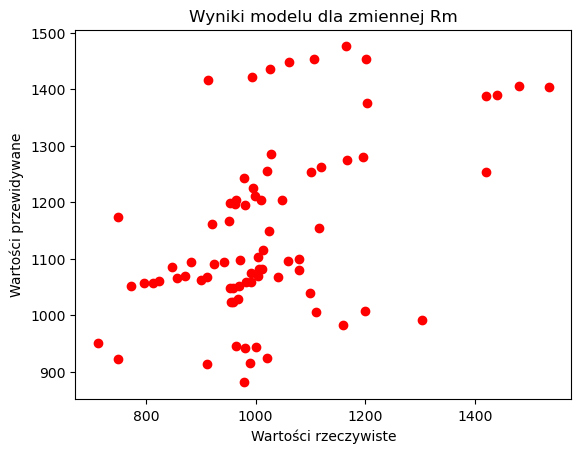

In [238]:
plt.scatter(y_test, y_pred, color='red')
plt.title('Wyniki modelu dla zmiennej Rm')
plt.xlabel("Wartości rzeczywiste")
plt.ylabel("Wartości przewidywane")
plt.show()

Text(0, 0.5, 'Wartości przewidywane')

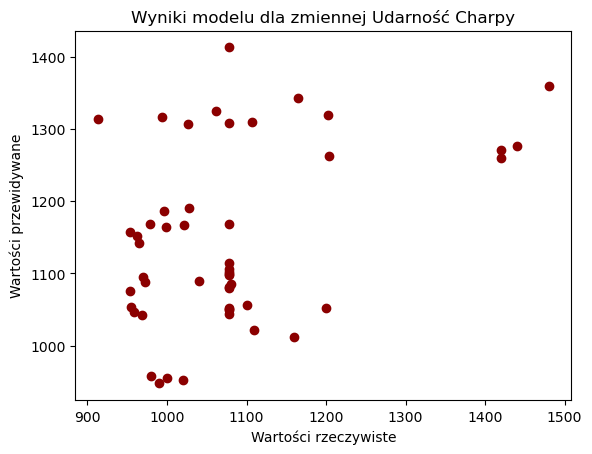

In [253]:
plt.scatter(y_test2, y_pred2, color='darkred')
plt.title('Wyniki modelu dla zmiennej Udarność Charpy')
plt.xlabel("Wartości rzeczywiste")
plt.ylabel("Wartości przewidywane")